# Harnessing Time Series Analysis and Machine Learning to Unravel Latent Patterns and Forecast Bitcoin Trading Volume

The aim of this project is to explore and apply various time series forecasting techniques and regression models specifically for predicting Bitcoin trading volume. By analyzing and comparing different models, the project aims to identify the most effective approach for forecasting Bitcoin trading volume in the given dataset. The use of both linear regression and advanced time series forecasting methods contributes to a comprehensive understanding of Bitcoin trading volume patterns and trends.

# What is Bitcoin? 

Bitcoin is a decentralized digital currency that operates on a peer-to-peer network, allowing for secure and transparent transactions without the need for a central authority or intermediary. It functions on blockchain technology, a distributed ledger that records all transactions across a network of computers. Bitcoin transactions are verified by network nodes through cryptography, ensuring the integrity and security of the currency.

As for the Bitcoin ETF (Exchange-Traded Fund) by BlackRock, an ETF is a financial product that tracks the price of Bitcoin, allowing investors to gain exposure to the cryptocurrency without directly owning it. BlackRock, a global investment management firm, has expressed interest in exploring the potential of a Bitcoin ETF, which could provide investors with a regulated and easily tradable investment vehicle tied to the performance of Bitcoin in the traditional financial markets. This ETF would enable investors to include Bitcoin in their portfolios through the convenience of stock trading on traditional exchanges.

In [1]:
import pandas as pd
import numpy as np
from scipy.stats import boxcox
from pandas.plotting import lag_plot
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from pandas import DataFrame
from pandas import Grouper
from math import sqrt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import SimpleExpSmoothing # SES
from statsmodels.tsa.holtwinters import Holt # Holts Exponential Smoothing
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns
from collections import Counter
import plotly.express as px
from plotly.offline import plot as off
import plotly.figure_factory as ff
import plotly.io as pio
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler, scale
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV, KFold, StratifiedKFold, cross_val_score, \
                                    train_test_split, RandomizedSearchCV
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_regression

In [2]:
df=pd.read_csv("Bitcoin.csv")
df

,Date,Open,High,Low,Close,Adj Close,Volume
0,18-09-2014,456.859985,456.859985,413.104004,424.440002,424.440002,3.448320e+07
1,19-09-2014,424.102997,427.834991,384.532013,394.795990,394.795990,3.791970e+07
2,20-09-2014,394.673004,423.295990,389.882996,408.903992,408.903992,3.686360e+07
3,21-09-2014,408.084991,412.425995,393.181000,398.821014,398.821014,2.658010e+07
4,22-09-2014,399.100006,406.915985,397.130005,402.152008,402.152008,2.412760e+07
...,...,...,...,...,...,...,...
3396,05-01-2024,44192.980470,44353.285160,42784.718750,44162.691410,44162.691410,3.233603e+10
3397,06-01-2024,44178.953130,44227.632810,43475.156250,43989.195310,43989.195310,1.609250e+10
3398,07-01-2024,43998.464840,44495.570310,43662.230470,43943.097660,43943.097660,1.933057e+10
3399,08-01-2024,43948.707030,47218.000000,43244.082030,46970.503910,46970.503910,4.274619e+10


Date: This column indicates the specific dates on which the financial data was recorded.

Open: This represents the opening price of the Bitcoin on the given date. The opening price is the price at which the first transaction occurred for that day.

High: The high price signifies the highest traded price of the Bitcoin on the recorded date.

Low: The low price denotes the lowest traded price of the Bitcoin on the given date.

Close: This is the closing price, indicating the last traded price of the Bitcoin on the recorded date.

Adj Close: The adjusted closing price considers factors such as dividends, stock splits, and new stock offerings to provide a more accurate reflection of the instrument's value.

Volume: This column represents the total number of shares or units of the Bitcoin traded on the given date.

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3401 entries, 0 to 3400
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       3401 non-null   object 
 1   Open       3401 non-null   float64
 2   High       3401 non-null   float64
 3   Low        3401 non-null   float64
 4   Close      3401 non-null   float64
 5   Adj Close  3401 non-null   float64
 6   Volume     3401 non-null   float64
dtypes: float64(6), object(1)
memory usage: 186.1+ KB


In [4]:
df.head(10)

,Date,Open,High,Low,Close,Adj Close,Volume
0,18-09-2014,456.859985,456.859985,413.104004,424.440002,424.440002,34483200.0
1,19-09-2014,424.102997,427.834991,384.532013,394.795990,394.795990,37919700.0
2,20-09-2014,394.673004,423.295990,389.882996,408.903992,408.903992,36863600.0
3,21-09-2014,408.084991,412.425995,393.181000,398.821014,398.821014,26580100.0
4,22-09-2014,399.100006,406.915985,397.130005,402.152008,402.152008,24127600.0
5,23-09-2014,402.092010,441.557007,396.196991,435.790985,435.790985,45099500.0
6,24-09-2014,435.751007,436.112000,421.131989,423.204987,423.204987,30627700.0
7,25-09-2014,423.156006,423.519989,409.467987,411.574005,411.574005,26814400.0
8,26-09-2014,411.428986,414.937988,400.009003,404.424988,404.424988,21460800.0
9,27-09-2014,403.556000,406.622986,397.372009,399.519989,399.519989,15029300.0


In [5]:
df.describe()

,Open,High,Low,Close,Adj Close,Volume
count,3401.000000,3401.000000,3401.000000,3401.000000,3401.000000,3.401000e+03
mean,14654.566509,14997.439610,14286.281314,14666.821826,14666.821826,1.659346e+10
std,16237.557171,16627.488876,15802.326789,16242.043014,16242.043014,1.908338e+10
min,176.897003,211.731003,171.509995,178.102997,178.102997,5.914570e+06
25%,919.810974,925.117004,902.223999,920.382019,920.382019,1.645820e+08
50%,8251.273438,8416.870117,8075.470215,8253.549805,8253.549805,1.161866e+10
75%,23946.007810,24550.837890,23481.173830,23947.642580,23947.642580,2.696772e+10
max,67549.734380,68789.625000,66382.062500,67566.828130,67566.828130,3.509680e+11


In [6]:
df.shape

(3401, 7)

In [7]:
grouped_data = df.groupby('Date').mean()
grouped_data

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
01-01-2015,320.434998,320.434998,314.002991,314.248993,314.248993,8.036550e+06
01-01-2016,430.721008,436.246002,427.515015,434.334015,434.334015,3.627890e+07
01-01-2017,963.658020,1003.080017,958.698975,998.325012,998.325012,1.477750e+08
01-01-2018,14112.200200,14112.200200,13154.700200,13657.200200,13657.200200,1.029120e+10
01-01-2019,3746.713379,3850.913818,3707.231201,3843.520020,3843.520020,4.324201e+09
...,...,...,...,...,...,...
31-12-2019,7294.438965,7335.290039,7169.777832,7193.599121,7193.599121,2.116795e+10
31-12-2020,28841.574220,29244.876950,28201.992190,29001.720700,29001.720700,4.675496e+10
31-12-2021,47169.371090,48472.527340,45819.953130,46306.445310,46306.445310,3.697417e+10


In [8]:
crosstab_result = pd.crosstab(df['Date'], df['Close'])
crosstab_result

Close,178.102997,199.259995,208.097000,209.843994,210.339005,210.494995,211.078995,211.315002,214.860992,217.110992,...,63557.871090,64155.941410,64261.992190,64469.527340,64949.960940,64995.230470,65466.839840,65992.835940,66971.828130,67566.828130
Date,,,,,,,,,,,,,,,,,,,,,
01-01-2015,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
01-01-2016,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
01-01-2017,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
01-01-2018,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
01-01-2019,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31-12-2019,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
31-12-2020,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
31-12-2021,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [9]:
df.nunique()

Date         3401
Open         3397
High         3398
Low          3399
Close        3398
Adj Close    3398
Volume       3401
dtype: int64

In [10]:
df[df.duplicated()].shape

(0, 7)

In [11]:
df[df.duplicated()]

,Date,Open,High,Low,Close,Adj Close,Volume


In [12]:
df = df[['Date', 'Volume']]

In [13]:
df['Date'] =  pd.to_datetime(df['Date'], format='%d-%m-%Y')

In [14]:
df.head(10)

,Date,Volume
0,2014-09-18,34483200.0
1,2014-09-19,37919700.0
2,2014-09-20,36863600.0
3,2014-09-21,26580100.0
4,2014-09-22,24127600.0
5,2014-09-23,45099500.0
6,2014-09-24,30627700.0
7,2014-09-25,26814400.0
8,2014-09-26,21460800.0
9,2014-09-27,15029300.0


In [15]:
df1 = df.copy()
df1.set_index('Date',inplace=True)

In [16]:
df1.head(10)

,Volume
Date,
2014-09-18,34483200.0
2014-09-19,37919700.0
2014-09-20,36863600.0
2014-09-21,26580100.0
2014-09-22,24127600.0
2014-09-23,45099500.0
2014-09-24,30627700.0
2014-09-25,26814400.0
2014-09-26,21460800.0


In [17]:
df["Date"] = pd.to_datetime(df.Date,format="%b-%y")
df["month"] = df.Date.dt.strftime("%b") # month extraction
df["year"] = df.Date.dt.strftime("%Y") # year extraction
df.head(10)

,Date,Volume,month,year
0,2014-09-18,34483200.0,Sep,2014
1,2014-09-19,37919700.0,Sep,2014
2,2014-09-20,36863600.0,Sep,2014
3,2014-09-21,26580100.0,Sep,2014
4,2014-09-22,24127600.0,Sep,2014
5,2014-09-23,45099500.0,Sep,2014
6,2014-09-24,30627700.0,Sep,2014
7,2014-09-25,26814400.0,Sep,2014
8,2014-09-26,21460800.0,Sep,2014
9,2014-09-27,15029300.0,Sep,2014


<Axes: xlabel='month', ylabel='year'>

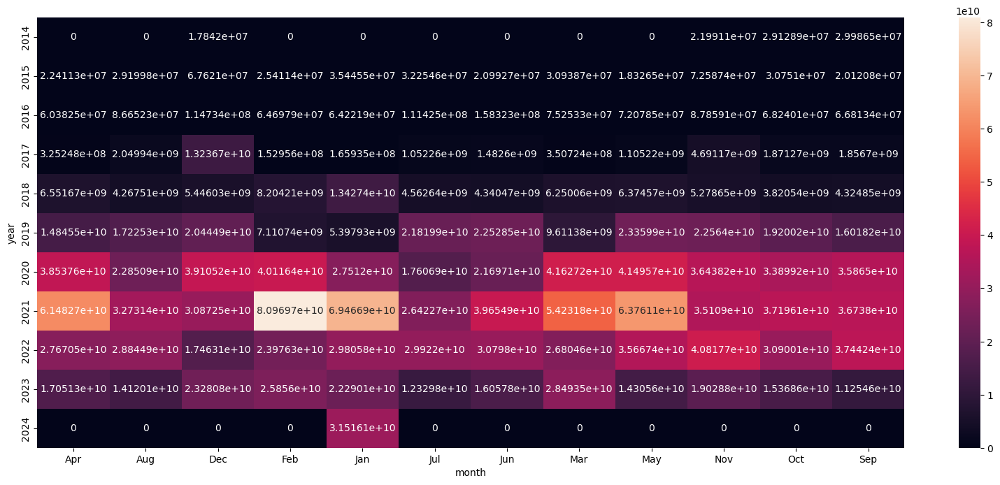

In [18]:
plt.figure(figsize=(20,8))
heatmap_y_month = pd.pivot_table(data=df,values="Volume",index="year",columns="month",aggfunc="mean",fill_value=0)
sns.heatmap(heatmap_y_month,annot=True,fmt="g") #fmt is format of the grid values

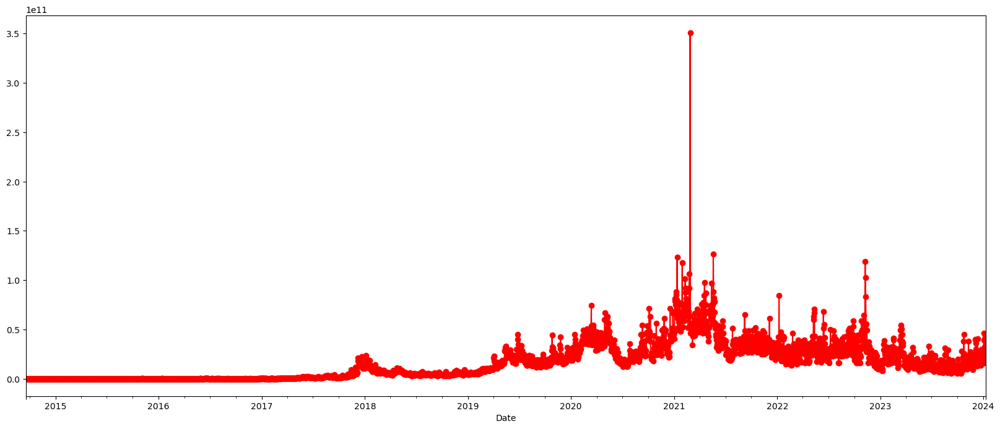

In [19]:
df1['Volume'].plot(figsize=(20, 8),color='red',marker='o')
plt.show()

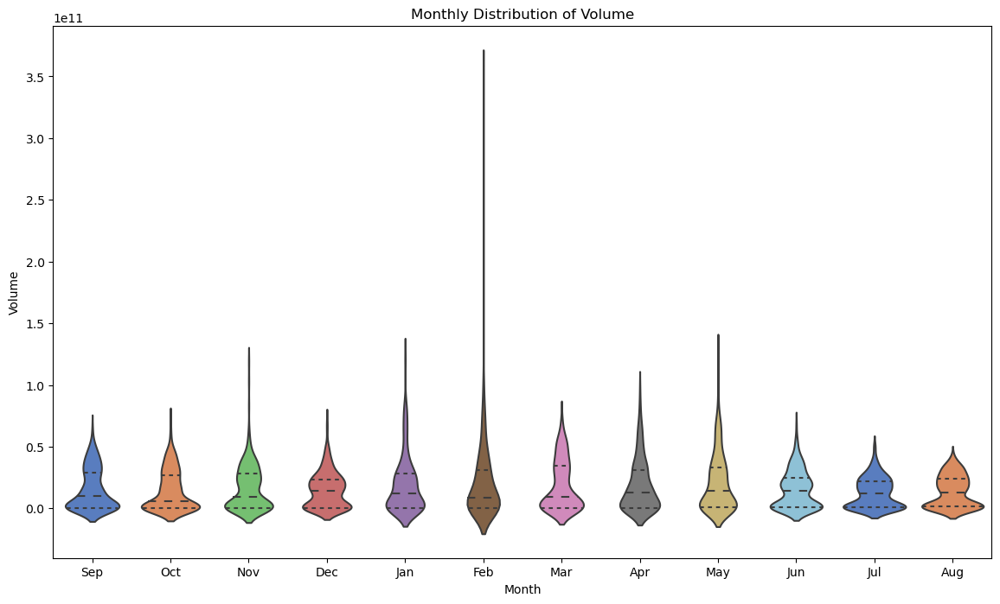

In [20]:
plt.figure(figsize=(14, 8))
sns.violinplot(x='month', y='Volume', data=df, inner="quartile", palette="muted")
plt.title('Monthly Distribution of Volume')
plt.xlabel('Month')
plt.ylabel('Volume')
plt.show()

C:\Users\Vikra\AppData\Local\Temp\ipykernel_13636\3310036864.py:2: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



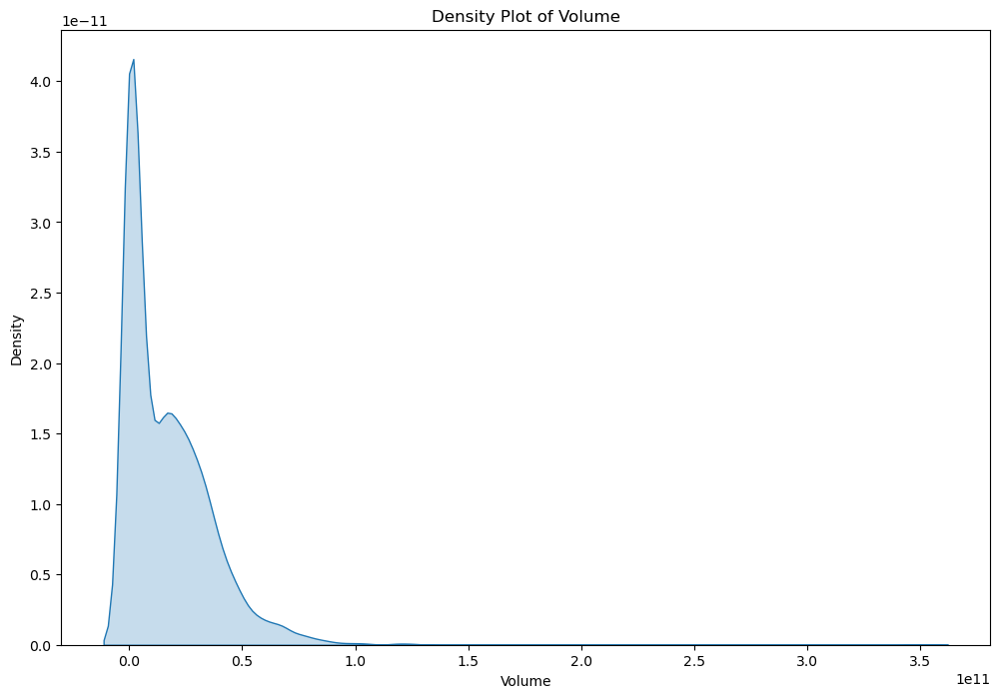

In [21]:
plt.figure(figsize=(12, 8))
sns.kdeplot(df['Volume'], fill=True, palette='husl')
plt.title('Density Plot of Volume')
plt.xlabel('Volume')
plt.ylabel('Density')
plt.show()

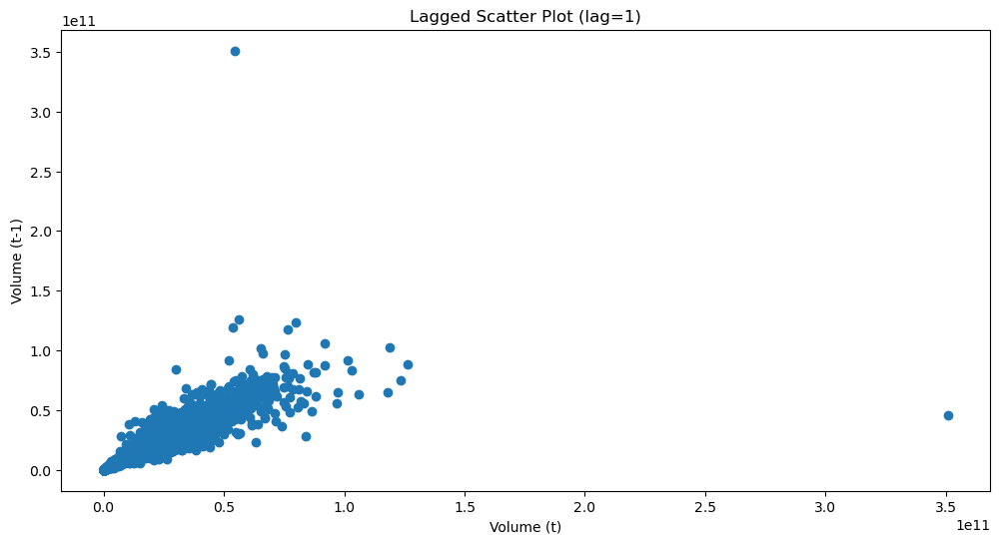

In [22]:
lag = 1
plt.figure(figsize=(12, 6))
plt.scatter(df['Volume'][:-lag], df['Volume'][lag:])
plt.title(f'Lagged Scatter Plot (lag={lag})')
plt.xlabel('Volume (t)')
plt.ylabel(f'Volume (t-{lag})')
plt.show()

In [23]:
import plotly.express as px
fig = px.line(df, x='Date', y='Volume', title='Interactive Time Series Plot', labels={'Volume': 'Volume'})
fig.update_xaxes(type='category')
fig.show()

In [24]:
fig = px.line(df, x='Date', y='Volume', title='Interactive Time Series Plot', labels={'Volume': 'Volume'})
fig.update_xaxes(title_text='Date', rangeslider_visible=True)
fig.update_layout(xaxis=dict(type='date'))
fig.show()

<Axes: xlabel='month', ylabel='Volume'>

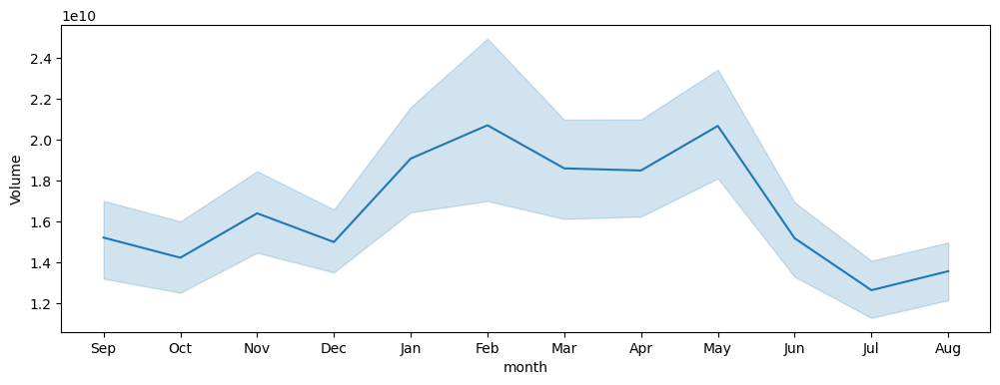

In [25]:
plt.figure(figsize=(12,4))
sns.lineplot(x="month",y="Volume",data=df)

<Axes: xlabel='year', ylabel='Volume'>

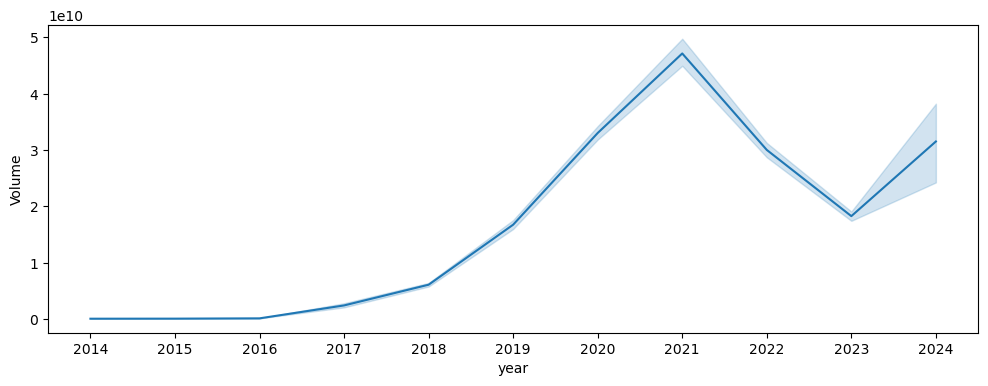

In [26]:
plt.figure(figsize=(12,4))
sns.lineplot(x="year",y="Volume",data=df)

<Axes: xlabel='year', ylabel='Volume'>

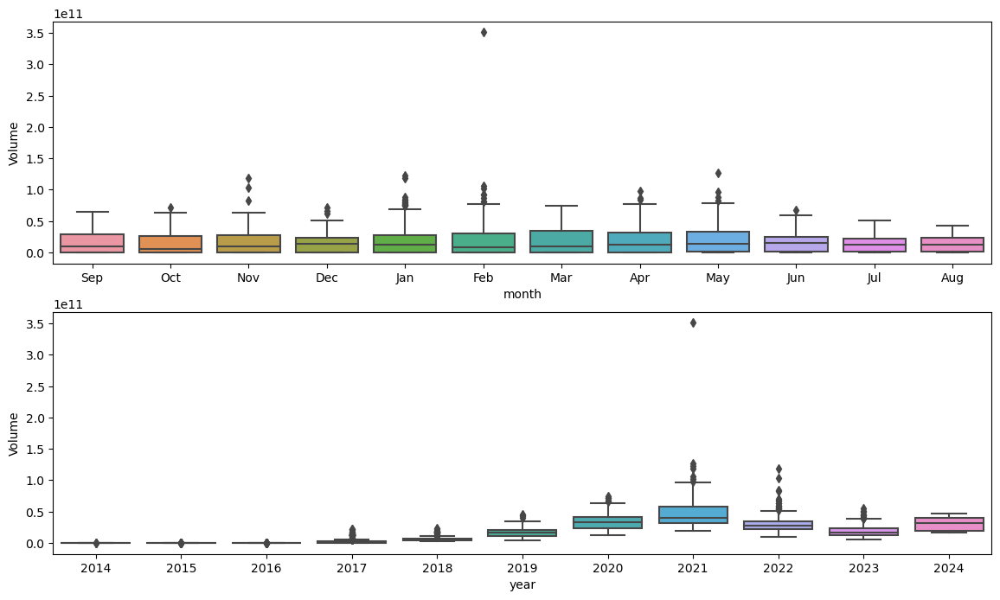

In [27]:
# Boxplot for ever
plt.figure(figsize=(14,8))
plt.subplot(211)
sns.boxplot(x="month",y="Volume",data=df)
plt.subplot(212)
sns.boxplot(x="year",y="Volume",data=df)

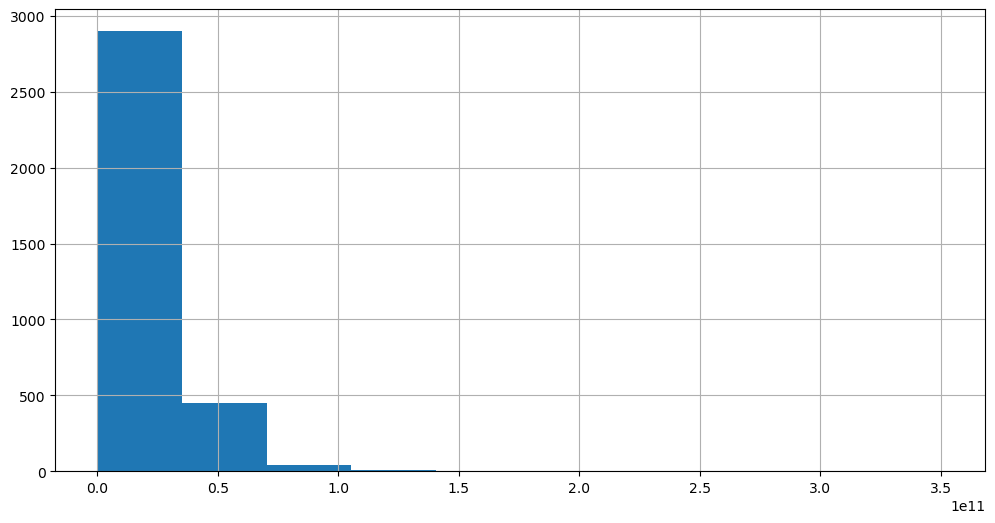

In [28]:
df.Volume.hist(figsize=(12,6))
plt.show()

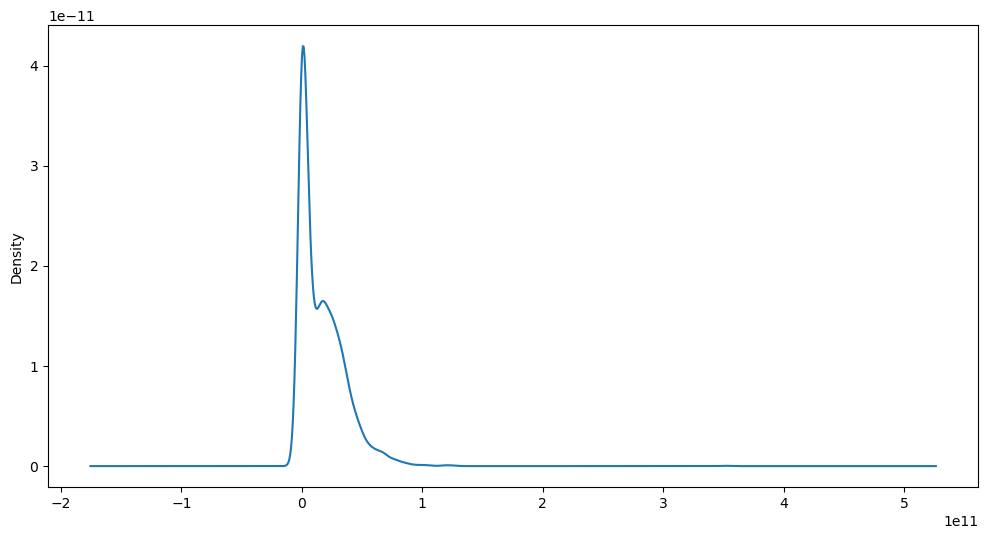

In [29]:
# create a density plot
df.Volume.plot(kind='kde', figsize=(12,6))
plt.show()

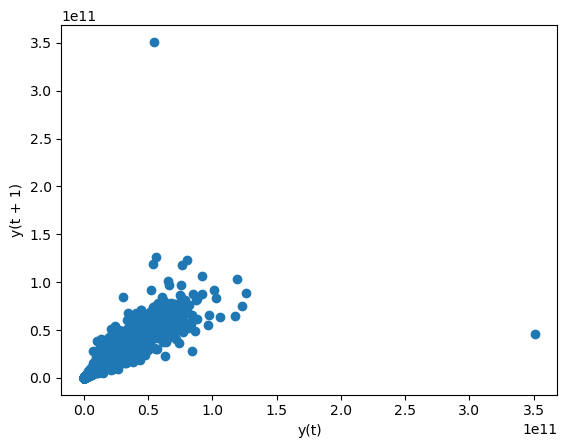

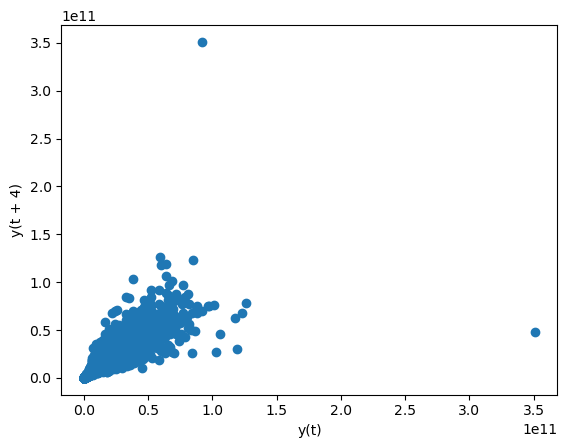

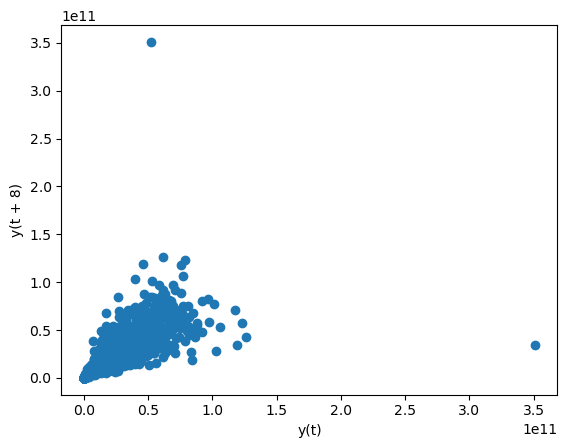

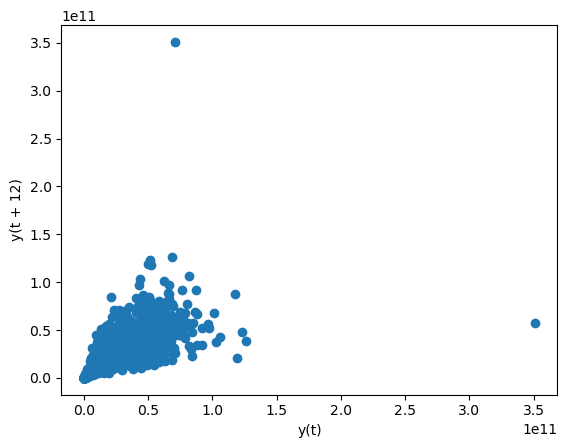

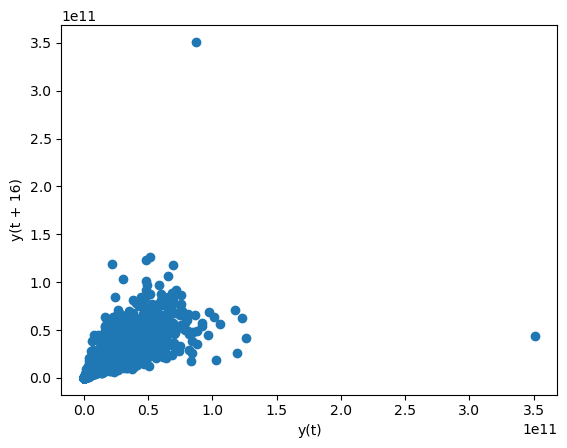

...

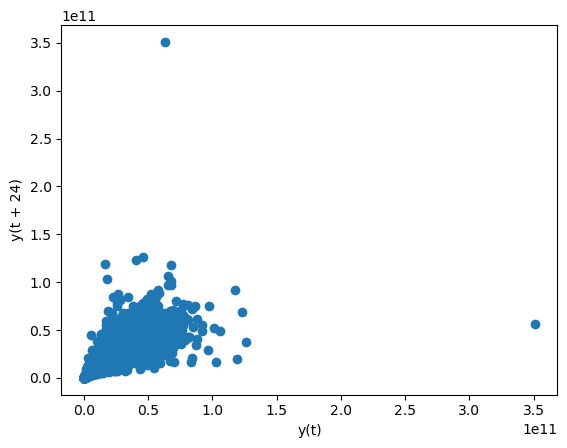

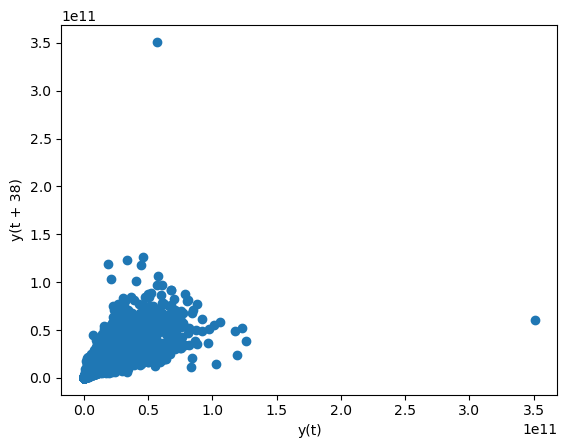

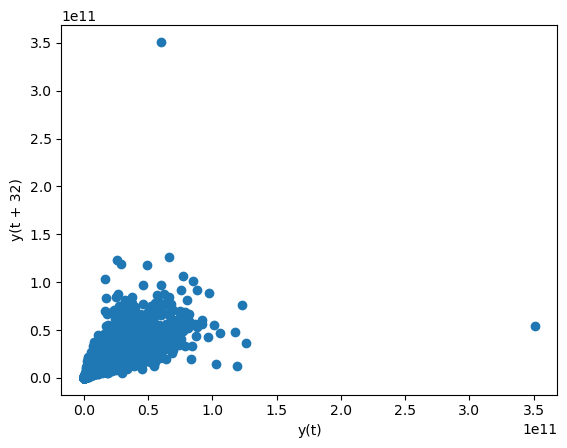

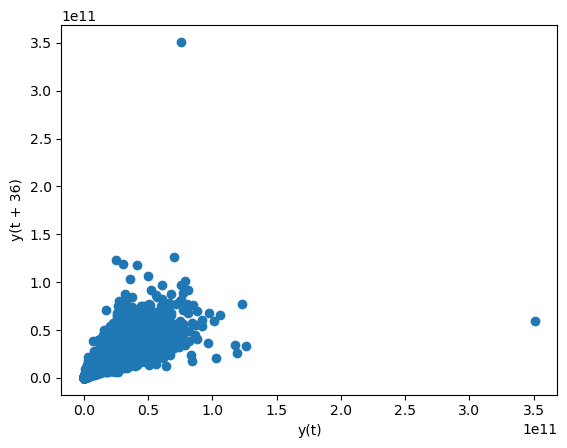

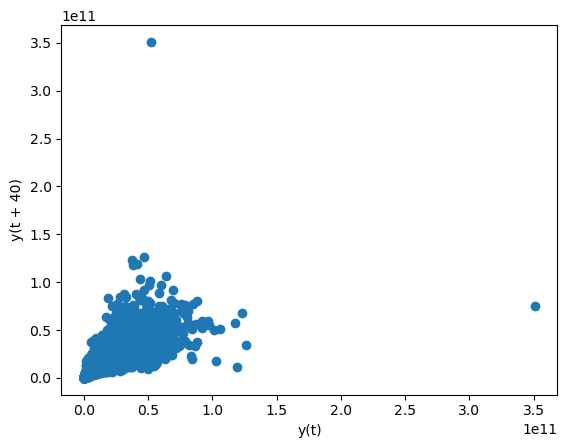

In [30]:
# create a scatter plot
for i in [1, 4, 8, 12, 16, 20, 24, 38, 32, 36, 40]:
    #plt.figure(figsize=(12,8))
    lag_plot(df.Volume, lag=i)
    plt.show()

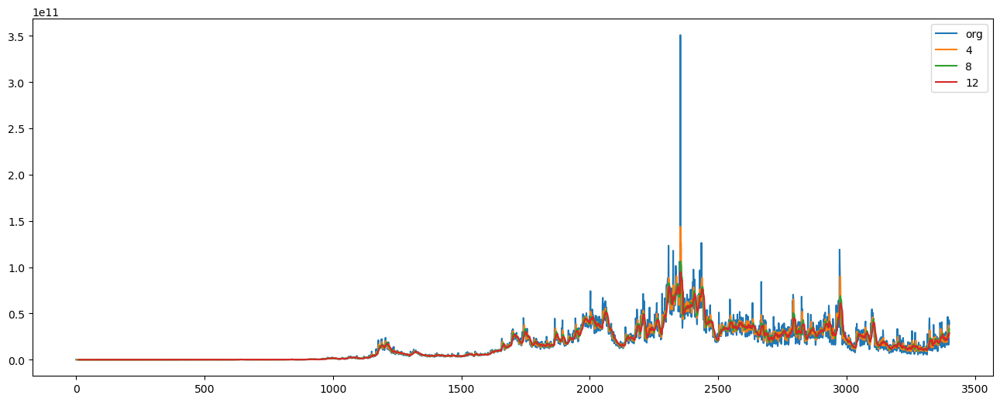

In [31]:
plt.figure(figsize=(16,6))
df.Volume.plot(label="org")
for i in range(4,13,4):
    df["Volume"].rolling(i).mean().plot(label=str(i))
plt.legend(loc='best')

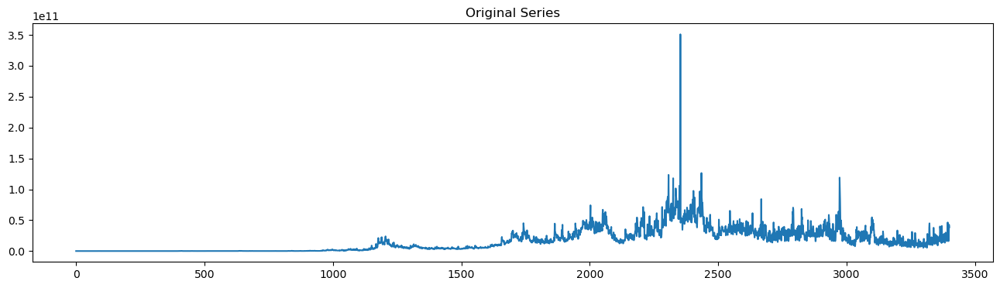

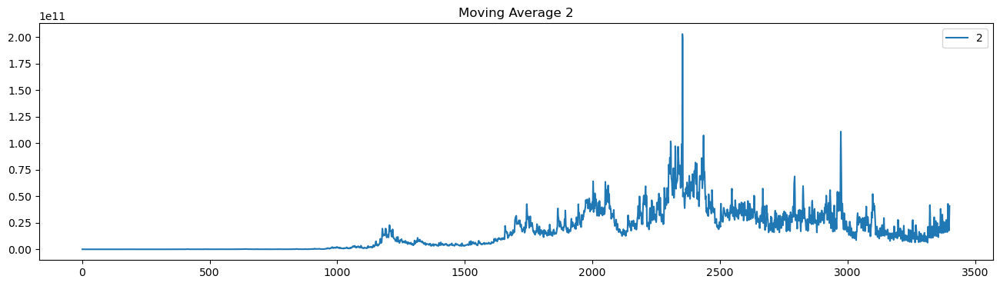

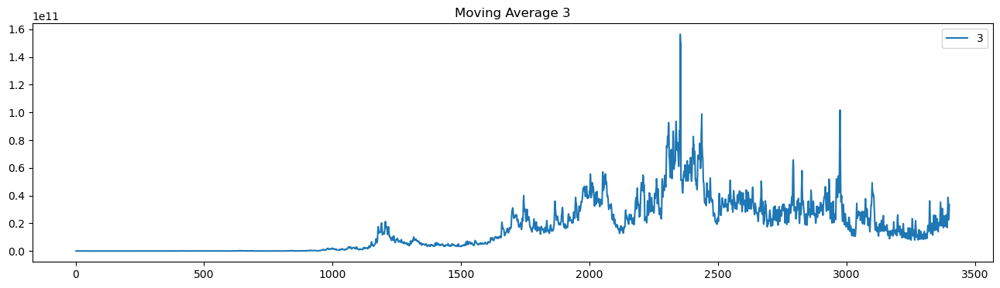

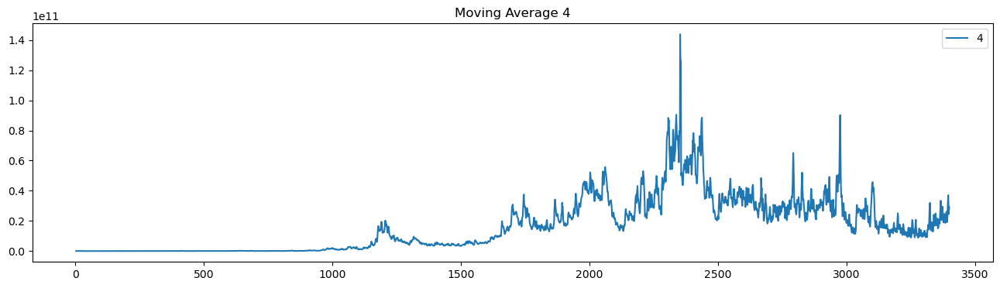

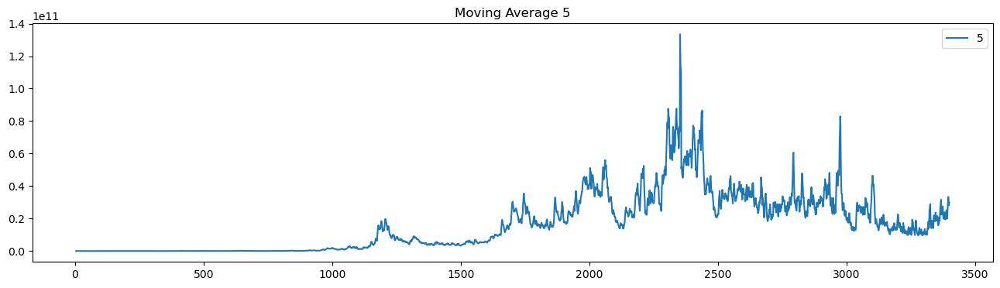

...

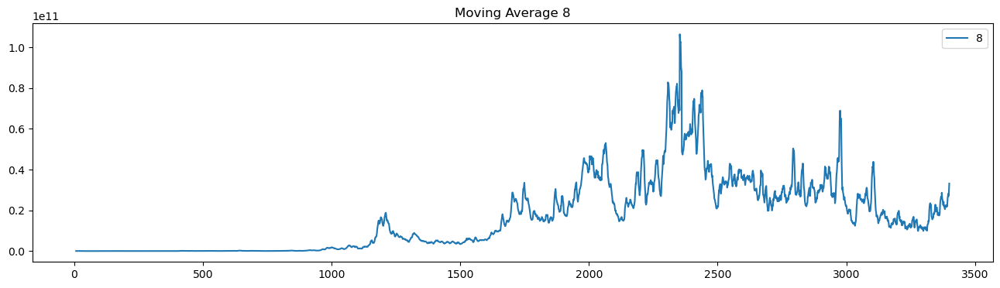

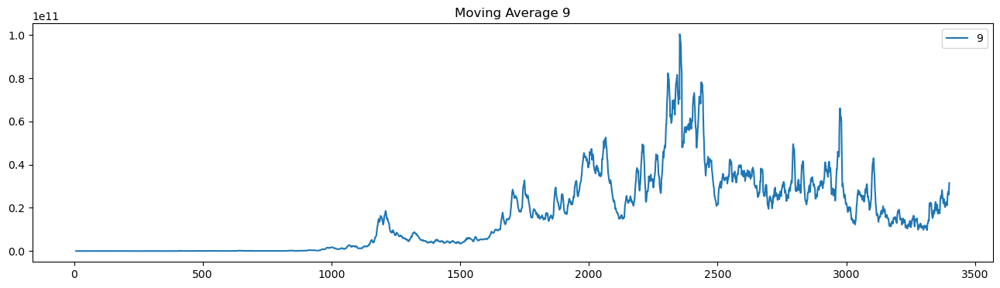

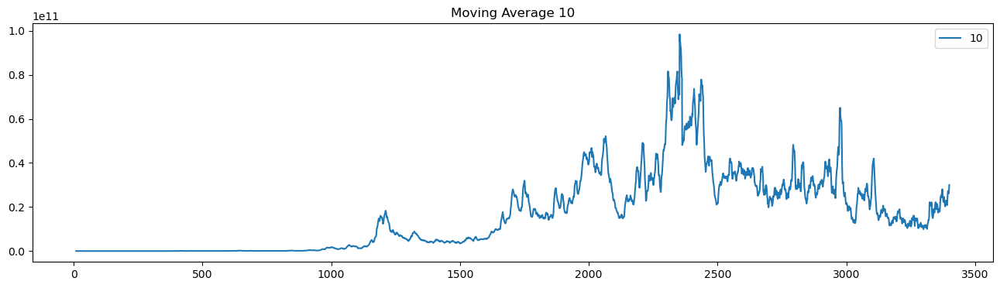

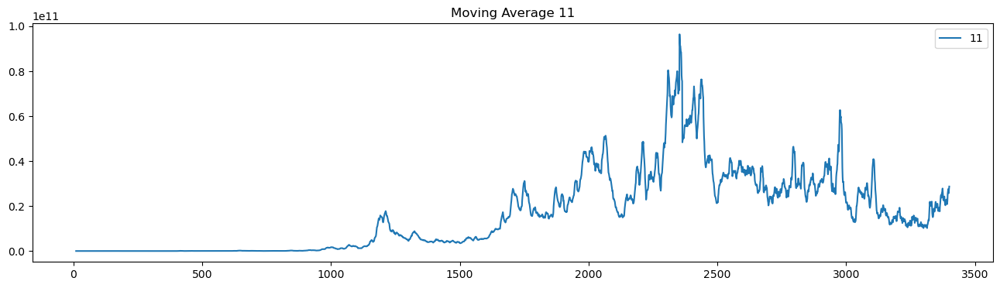

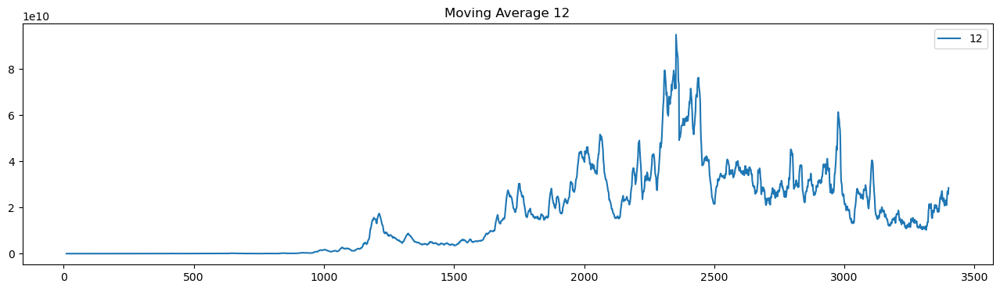

In [32]:
plt.figure(figsize=(16,4))
df.Volume.plot(label="org")
plt.title("Original Series")
for i in range(2,13):
    plt.figure(figsize=(16,4))
    df["Volume"].rolling(i).mean().plot(label=str(i))
    plt.title("Moving Average "+str(i))
    plt.legend(loc='best')
    plt.show()

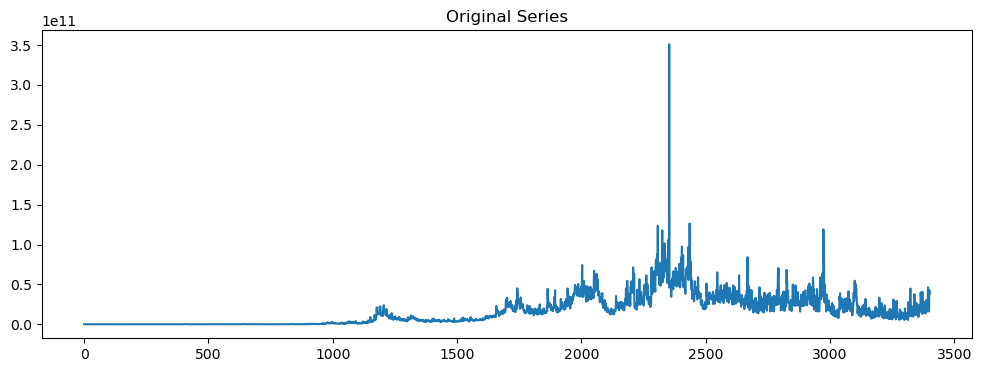

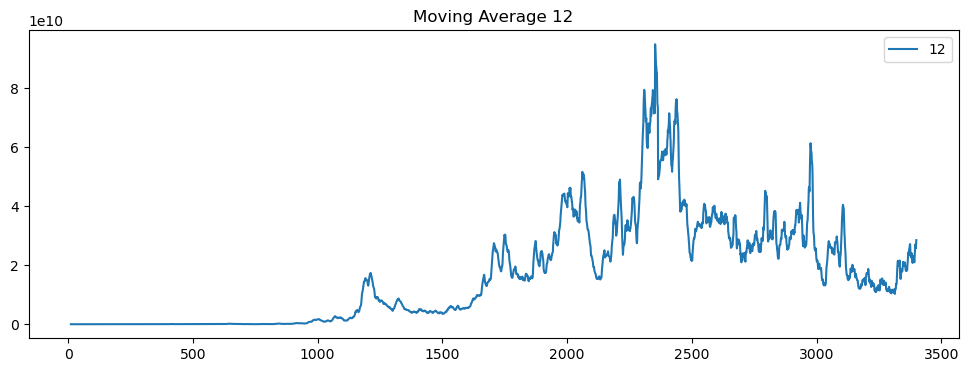

In [33]:
plt.figure(figsize=(12,4))
df.Volume.plot(label="org")
plt.title("Original Series")
plt.figure(figsize=(12,4))
df["Volume"].rolling(12).mean().plot(label=str(12))
plt.title("Moving Average "+str(12))
plt.legend(loc='best')
plt.show()

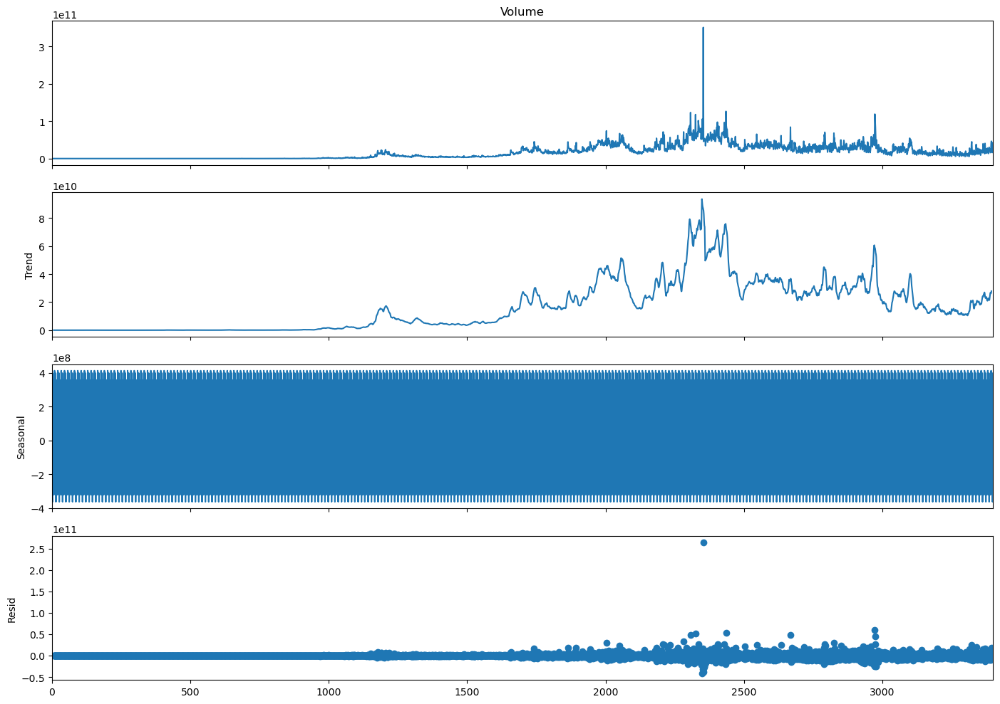

In [34]:
decompose_ts_add = seasonal_decompose(df.Volume,period=12)
with plt.rc_context():
    plt.rc("figure", figsize=(14,10))
    decompose_ts_add.plot()
    plt.show()

In [35]:
visual = df1.copy()
visual.reset_index(inplace=True)
visual['date'] = pd.to_datetime(visual['Date'])
visual['year'] = visual['Date'].dt.year
visual['month'] = visual['Date'].dt.month
visual['week'] = visual['Date'].dt.isocalendar().week
visual['quarter'] = visual['Date'].dt.quarter
visual['day_of_week'] = visual['Date'].dt.day_name()
visual.drop('Date', axis =1 , inplace= True)
visual.head(10)

,Volume,date,year,month,week,quarter,day_of_week
0,34483200.0,2014-09-18,2014,9,38,3,Thursday
1,37919700.0,2014-09-19,2014,9,38,3,Friday
2,36863600.0,2014-09-20,2014,9,38,3,Saturday
3,26580100.0,2014-09-21,2014,9,38,3,Sunday
4,24127600.0,2014-09-22,2014,9,39,3,Monday
5,45099500.0,2014-09-23,2014,9,39,3,Tuesday
6,30627700.0,2014-09-24,2014,9,39,3,Wednesday
7,26814400.0,2014-09-25,2014,9,39,3,Thursday
8,21460800.0,2014-09-26,2014,9,39,3,Friday
9,15029300.0,2014-09-27,2014,9,39,3,Saturday


In [36]:
import calendar
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Assuming visual is your DataFrame
df_m_sa = visual.groupby('month').agg({"Volume": "mean"}).reset_index()
df_m_sa['Volume'] = round(df_m_sa['Volume'], 2)
df_m_sa['month_text'] = df_m_sa['month'].apply(lambda x: calendar.month_abbr[x])
df_m_sa['text'] = df_m_sa['month_text'] + ' - ' + df_m_sa['Volume'].astype(str)

df_w_sa = visual.groupby('week').agg({"Volume": "mean"}).reset_index()
df_q_sa = visual.groupby('quarter').agg({"Volume": "mean"}).reset_index()

# Chart colors
df_m_sa['color'] = 'red'  # Set the color to red for all bars
df_w_sa['color'] = 'red'

# Chart
fig = make_subplots(rows=2, cols=2, vertical_spacing=0.08,
                    row_heights=[0.7, 0.3],
                    specs=[[{"type": "bar"}, {"type": "pie"}],
                           [{"colspan": 2}, None]],
                    column_widths=[0.7, 0.3],
                    subplot_titles=("Month wise Avg Volume Analysis", "Quarter wise Avg Volume Analysis",
                                    "Week wise Avg Volume Analysis"))

fig.add_trace(go.Bar(x=df_m_sa['Volume'], y=df_m_sa['month'], marker=dict(color=df_m_sa['color']),
                     text=df_m_sa['text'], textposition='auto',
                     name='Month', orientation='h'),
              row=1, col=1)
fig.add_trace(go.Pie(values=df_q_sa['Volume'], labels=df_q_sa['quarter'], name='Quarter',
                     marker=dict(colors=['#FF5733', '#FF8040', '#FF9966', '#FFB280', '#FFCC99']),
                     hole=0.7,
                     hoverinfo='label+percent+value', textinfo='label+percent'),
              row=1, col=2)
fig.add_trace(go.Scatter(x=df_w_sa['week'], y=df_w_sa['Volume'], mode='lines+markers', fill='tozeroy',
                         fillcolor='red',
                         marker=dict(color='#FF5733'), name='Week'),
              row=2, col=1)

# Styling
fig.update_yaxes(visible=False, row=1, col=1)
fig.update_xaxes(visible=False, row=1, col=1)
fig.update_xaxes(tickmode='array', tickvals=df_w_sa.week, ticktext=[i for i in range(1, 53)],
                 row=2, col=1)
fig.update_yaxes(visible=False, row=2, col=1)
fig.update_layout(height=750, bargap=0.15,
                  margin=dict(b=0, r=20, l=20),
                  title_text="Average Volume Analysis",
                  template="plotly_white",
                  title_font=dict(size=25, color='#8a8d93', family="Lato, sans-serif"),
                  font=dict(color='#8a8d93'),
                  hoverlabel=dict(bgcolor="#f2f2f2", font_size=13, font_family="Lato, sans-serif"),
                  showlegend=False)
fig.show()

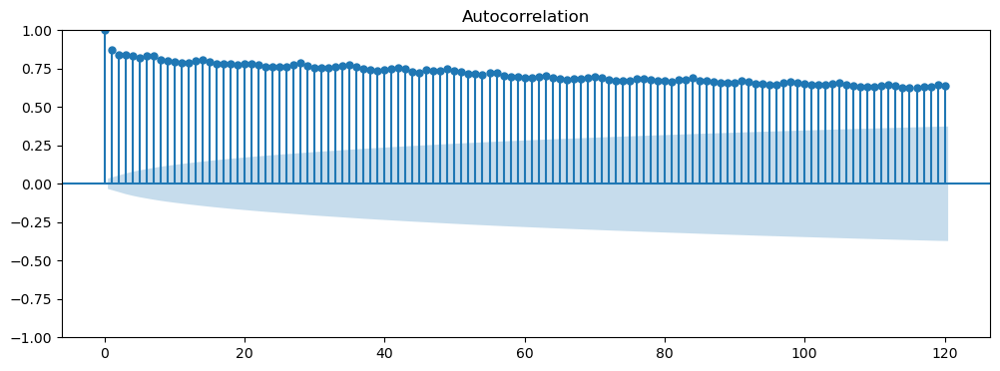

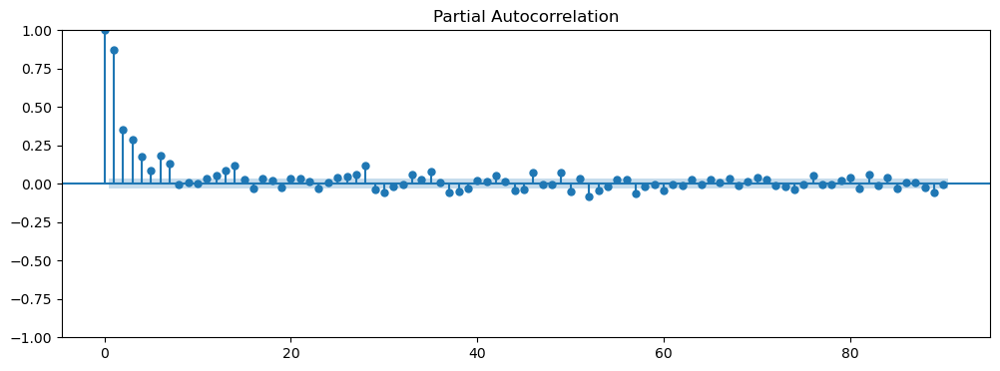

In [37]:
import statsmodels.graphics.tsaplots as tsa_plots
with plt.rc_context():
    plt.rc("figure", figsize=(12,4))
    tsa_plots.plot_acf(df.Volume,lags=120)
    tsa_plots.plot_pacf(df.Volume,lags=90)
    plt.show()

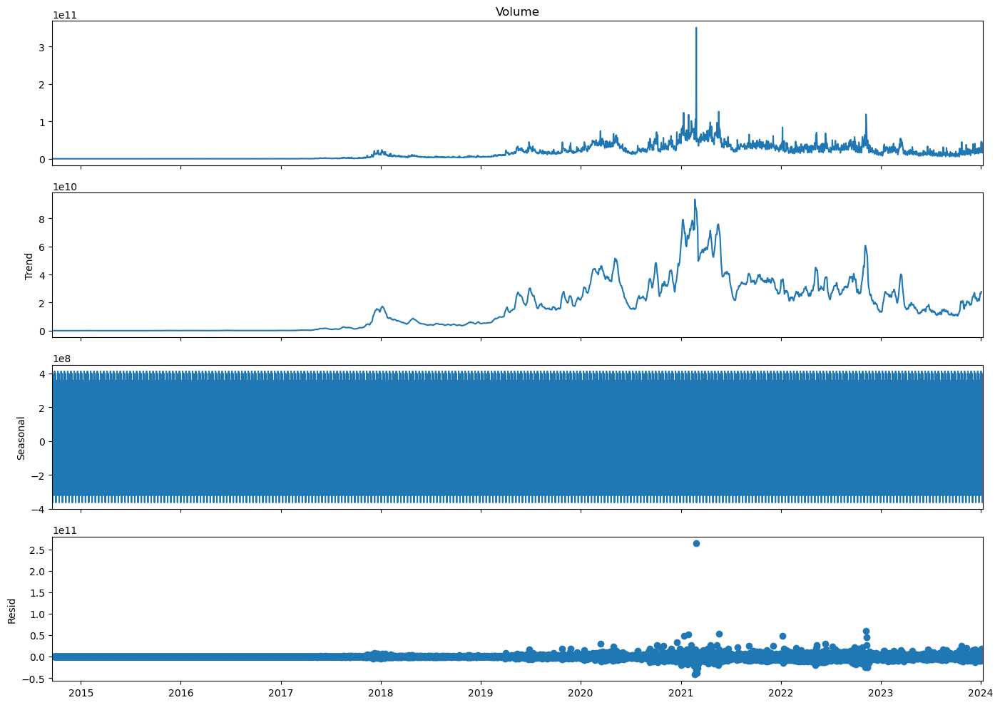

In [38]:
decompose_ts_add = seasonal_decompose(df1.Volume,period=12, model='additive')
with plt.rc_context():
    plt.rc("figure", figsize=(14,10))
    decompose_ts_add.plot()
    plt.show()

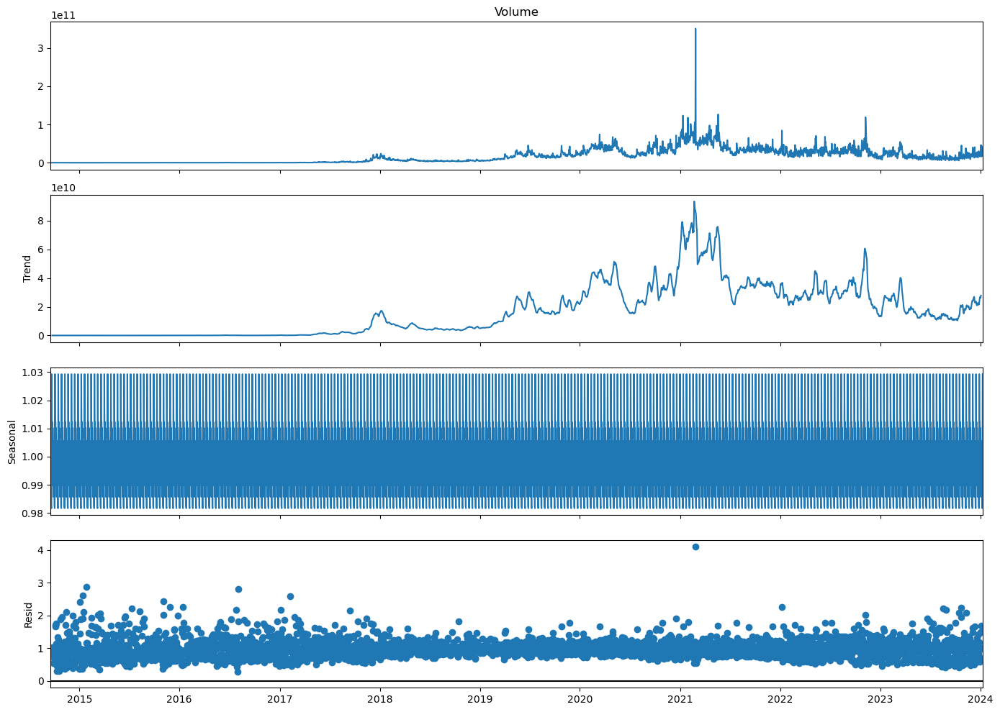

In [39]:
decompose_ts_add = seasonal_decompose(df1.Volume,period=12, model='multiplicative')
with plt.rc_context():
    plt.rc("figure", figsize=(14,10))
    decompose_ts_add.plot()
    plt.show()

In [40]:
df1.shape

(3401, 1)

In [41]:
size = 2800
train_data = df1[:size]
test_data = df1[size:]

In [42]:
print('Train:',train_data.index.max(),'\n',
'Test:',test_data.index.min())

Train: 2022-05-18 00:00:00 
 Test: 2022-05-19 00:00:00


<Axes: xlabel='Date'>

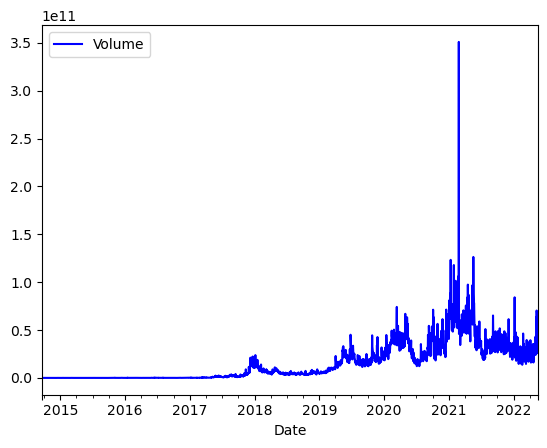

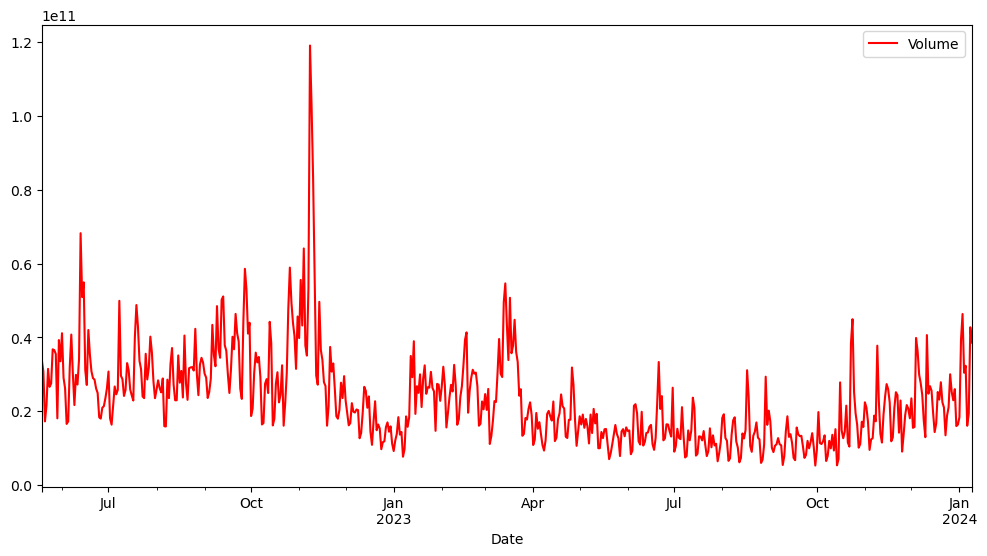

In [43]:
train_data.plot(legend=True,label='TRAIN',color='blue')
test_data.plot(legend=True,label='TEST', figsize=(12,6),color='red')

In [44]:
def MAPE(pred,org):
    temp = ((org-pred)/org)*100

    return np.mean(temp)

In [45]:
print(len(train_data), len(test_data.Volume))
#print(len(test_pred_ses))

2800 601


In [46]:
#test_pred_ses.shape

In [47]:
#test_data.Close.shape

In [48]:
#test_pred_ses

In [49]:
test_data.Volume

Date
2022-05-19    3.377345e+10
2022-05-20    3.074938e+10
2022-05-21    1.727484e+10
2022-05-22    2.163153e+10
2022-05-23    3.148345e+10
                  ...     
2024-01-05    3.233603e+10
2024-01-06    1.609250e+10
2024-01-07    1.933057e+10
2024-01-08    4.274619e+10
2024-01-09    3.858702e+10
Name: Volume, Length: 601, dtype: float64

In [50]:
#temp = (test_pred_ses)
#temp

In [51]:
df1.isnull().sum()

Volume    0
dtype: int64

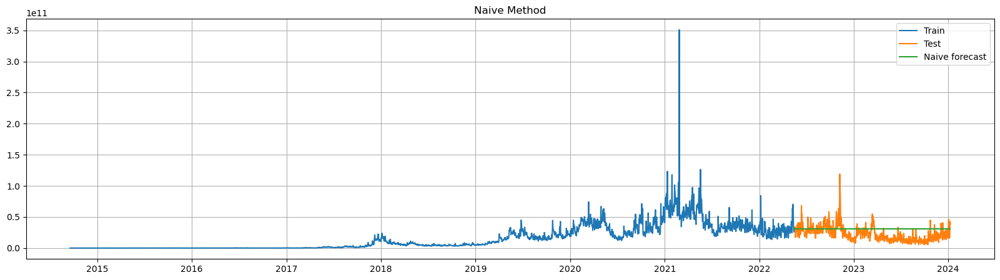

In [52]:
y_hat_naive = test_data.copy()
y_hat_naive['naive_forecast'] = train_data['Volume'][size-1]
plt.figure(figsize=(20,5))
plt.grid()
plt.plot(train_data['Volume'], label='Train')
plt.plot(test_data['Volume'], label='Test')
plt.plot(y_hat_naive['naive_forecast'], label='Naive forecast')
plt.legend(loc='best')
plt.title('Naive Method')
plt.show()

In [53]:
'''
# Assuming train_data_boxcox_diff and test_data_boxcox_diff are pandas Series or DataFrames
window_size = 3

# Calculate the moving average for training data
train_data_boxcox_diff['Moving_Avg'] = train_data_boxcox_diff['Volume'].rolling(window=window_size).mean()

# Plotting the original data and the moving average
plt.figure(figsize=(10, 6))
plt.plot(train_data_boxcox_diff['Volume'], label='Original Data')
plt.plot(train_data_boxcox_diff['Moving_Avg'], label=f'Moving Average ({window_size} periods)')
plt.title('Moving Average Forecast - Training Data')
plt.xlabel('Time')
plt.ylabel('Volume')
plt.legend()
plt.show()

# Calculate the moving average for test data
test_data_boxcox_diff['Moving_Avg'] = test_data_boxcox_diff['Volume'].rolling(window=window_size).mean()

# Plotting the original data and the moving average for test data
plt.figure(figsize=(10, 6))
plt.plot(test_data_boxcox_diff['Volume'], label='Original Data')
plt.plot(test_data_boxcox_diff['Moving_Avg'], label=f'Moving Average ({window_size} periods)')
plt.title('Moving Average Forecast - Test Data')
plt.xlabel('Time')
plt.ylabel('Your Data Column')
plt.legend()
plt.show()'''

"\n# Assuming train_data_boxcox_diff and test_data_boxcox_diff are pandas Series or DataFrames\nwindow_size = 3\n\n# Calculate the moving average for training data\ntrain_data_boxcox_diff['Moving_Avg'] = train_data_boxcox_diff['Volume'].rolling(window=window_size).mean()\n\n# Plotting the original data and the moving average\nplt.figure(figsize=(10, 6))\nplt.plot(train_data_boxcox_diff['Volume'], label='Original Data')\nplt.plot(train_data_boxcox_diff['Moving_Avg'], label=f'Moving Average ({window_size} periods)')\nplt.title('Moving Average Forecast - Training Data')\nplt.xlabel('Time')\nplt.ylabel('Volume')\nplt.legend()\nplt.show()\n\n# Calculate the moving average for test data\ntest_data_boxcox_diff['Moving_Avg'] = test_data_boxcox_diff['Volume'].rolling(window=window_size).mean()\n\n# Plotting the original data and the moving average for test data\nplt.figure(figsize=(10, 6))\nplt.plot(test_data_boxcox_diff['Volume'], label='Original Data')\nplt.plot(test_data_boxcox_diff['Moving_

In [54]:
ses_model = SimpleExpSmoothing(train_data['Volume']).fit(optimized=True)
test_pred_ses = ses_model.forecast(601)
train_pred_ses = ses_model.fittedvalues
test_rmse_ses = sqrt(mean_squared_error(test_pred_ses,test_data.Volume))
train_rmse_ses = sqrt(mean_squared_error(train_pred_ses,train_data))
mape_ses = MAPE(test_pred_ses,test_data.Volume)
print('Simple Exponential Method Evaluation',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_ses),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_ses),"\n",
'Test Root Mean Squared Error = {}'.format(test_rmse_ses))

Simple Exponential Method Evaluation 
 Mean Absolute Percent Error = -101.53382235599442 
 Train Root Mean Squared Error = 8064822923.308032 
 Test Root Mean Squared Error = 18011558203.428345


D:\Anaconda baby\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

D:\Anaconda baby\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:917: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



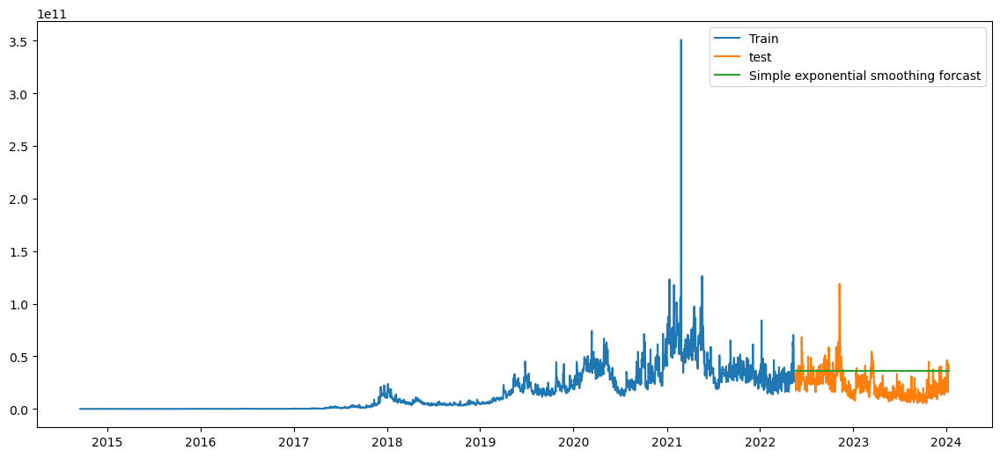

In [55]:
plt.figure(figsize=(14,6))
plt.plot(train_data, label='Train')
plt.plot(test_data, label='test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.legend(loc='best')
plt.show()

In [56]:
dexp_model  = Holt(train_data).fit(optimized=True)
test_pred_dexp = dexp_model.forecast(601)
train_pred_dexp = dexp_model.fittedvalues
test_rmse_dexp = sqrt(mean_squared_error(test_pred_dexp,test_data.Volume))
train_rmse_dexp = sqrt(mean_squared_error(train_pred_dexp,train_data))
mape_dexp = MAPE(test_pred_dexp,test_data.Volume)
print('Simple Exponential Method Evaluation',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_dexp),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_dexp),"\n",
'Test Root Mean Squared Error = {}'.format(test_rmse_dexp))

Simple Exponential Method Evaluation 
 Mean Absolute Percent Error = -112.09685817380951 
 Train Root Mean Squared Error = 8065190730.449006 
 Test Root Mean Squared Error = 19561895641.933002


D:\Anaconda baby\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

D:\Anaconda baby\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:917: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



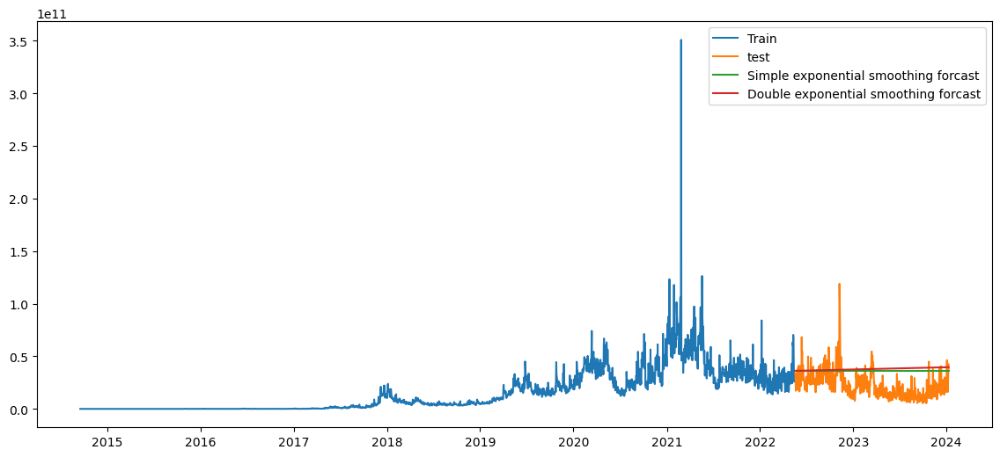

In [57]:
plt.figure(figsize=(14,6))
plt.plot(train_data, label='Train')
plt.plot(test_data, label='test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.plot(test_pred_dexp, label='Double exponential smoothing forcast')
plt.legend(loc='best')
plt.show()

In [58]:
texp_add_model  = ExponentialSmoothing(train_data,seasonal="add",trend="add",seasonal_periods=12).fit(optimized=True)
test_pred_ad_texp = texp_add_model.forecast(601)
train_pred_ad_texp = texp_add_model.fittedvalues
test_rmse_ad_texp = sqrt(mean_squared_error(test_pred_ad_texp,test_data.Volume))
train_rmse_ad_texp = sqrt(mean_squared_error(train_pred_ad_texp,train_data))
mape_ad_texp = MAPE(test_pred_ad_texp,test_data.Volume)
print('Triple Exponential with Additive Trend and Seosonality Method Evaluation',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_ad_texp),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_ad_texp),"\n",
'Test Root Mean Squared Error = {}'.format(test_rmse_ad_texp))

D:\Anaconda baby\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



Triple Exponential with Additive Trend and Seosonality Method Evaluation 
 Mean Absolute Percent Error = -109.59966667218893 
 Train Root Mean Squared Error = 8065311214.888806 
 Test Root Mean Squared Error = 19191367569.11682


D:\Anaconda baby\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:917: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



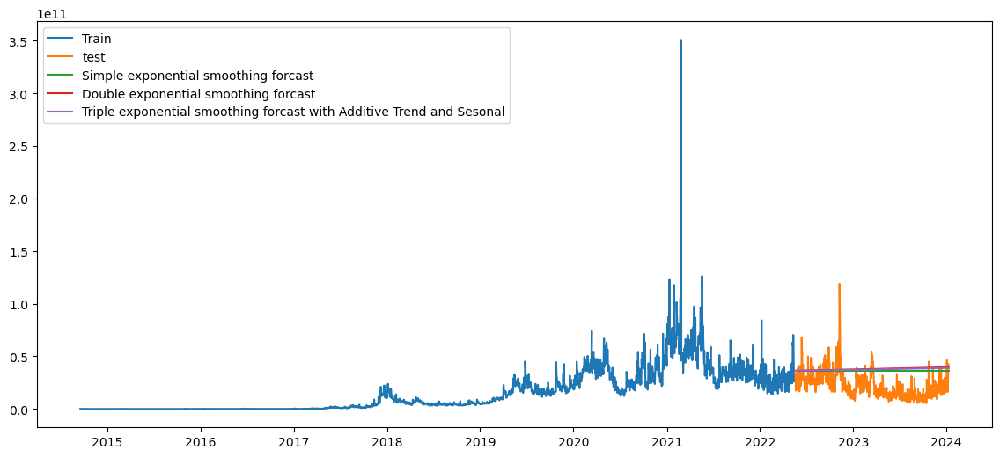

In [59]:
plt.figure(figsize=(14,6))
plt.plot(train_data, label='Train')
plt.plot(test_data, label='test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.plot(test_pred_dexp, label='Double exponential smoothing forcast')
plt.plot(test_pred_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Sesonal')
plt.legend(loc='best')
plt.show()

In [60]:
texp_mul_ad_model  = ExponentialSmoothing(train_data,seasonal="mul",trend="add",seasonal_periods=12).fit(optimized=True)
test_pred_mul_ad_texp = texp_mul_ad_model.forecast(601)
train_pred_mul_ad_texp = texp_mul_ad_model.fittedvalues
test_rmse_mul_ad_texp = sqrt(mean_squared_error(test_pred_mul_ad_texp,test_data.Volume))
train_rmse_mul_ad_texp = sqrt(mean_squared_error(train_pred_mul_ad_texp,train_data))
mape_mul_ad_texp = MAPE(test_pred_mul_ad_texp,test_data.Volume)
print('Triple Exponential Method with Multiplicative Seasonality and Additive Trend',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_mul_ad_texp),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_mul_ad_texp),"\n",
'Test Root Mean Squared Error = {}'.format(test_rmse_mul_ad_texp))

D:\Anaconda baby\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



Triple Exponential Method with Multiplicative Seasonality and Additive Trend 
 Mean Absolute Percent Error = -110.82450618933841 
 Train Root Mean Squared Error = 8114178262.218703 
 Test Root Mean Squared Error = 19428822023.938507


D:\Anaconda baby\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:917: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



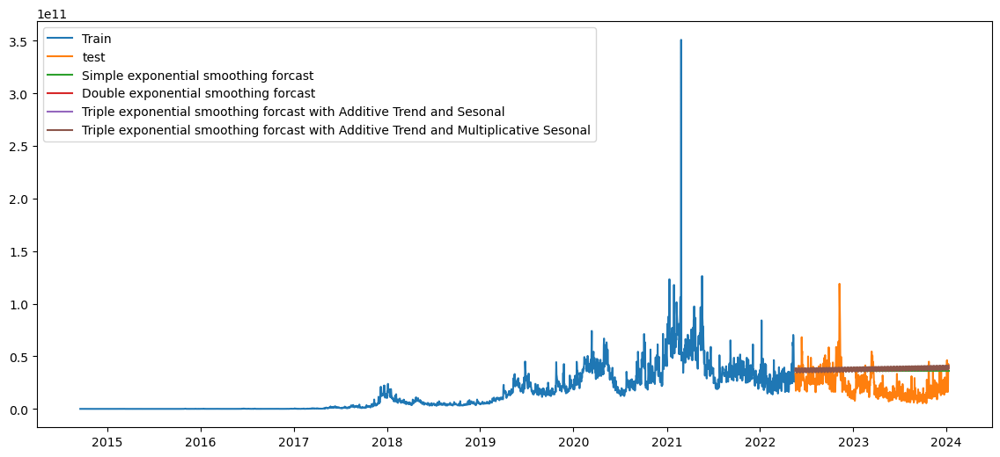

In [61]:
plt.figure(figsize=(14,6))
plt.plot(train_data, label='Train')
plt.plot(test_data, label='test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.plot(test_pred_dexp, label='Double exponential smoothing forcast')
plt.plot(test_pred_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Sesonal')
plt.plot(test_pred_mul_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Multiplicative Sesonal')
plt.legend(loc='best')
plt.show()

In [62]:
texp_ad_mul_model  = ExponentialSmoothing(train_data,seasonal="add",trend="mul",seasonal_periods=12).fit(smoothing_level=0.1, smoothing_slope=0.5)
test_pred_ad_mul_texp  = texp_ad_mul_model.forecast(601)
train_pred_ad_mul_texp  = texp_ad_mul_model.fittedvalues
test_rmse_ad_mul_texp  = sqrt(mean_squared_error(test_pred_ad_mul_texp ,test_data.Volume))
train_rmse_ad_mul_texp  = sqrt(mean_squared_error(train_pred_ad_mul_texp ,train_data))
mape_ad_mul_texp  = MAPE(test_pred_ad_mul_texp,test_data.Volume)
print('Triple Exponential Method with Additive Seasonality and Multiplicative Trend',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_ad_mul_texp ),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_ad_mul_texp ),"\n",
'Test Root Mean Squared Error = {}'.format(test_rmse_ad_mul_texp ))

Triple Exponential Method with Additive Seasonality and Multiplicative Trend 
 Mean Absolute Percent Error = 99.18426082945446 
 Train Root Mean Squared Error = 10300822714.602236 
 Test Root Mean Squared Error = 25921356369.725163


D:\Anaconda baby\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\Vikra\AppData\Local\Temp\ipykernel_13636\3832228341.py:1: FutureWarning:

the 'smoothing_slope' keyword is deprecated, use 'smoothing_trend' instead.

D:\Anaconda baby\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:917: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



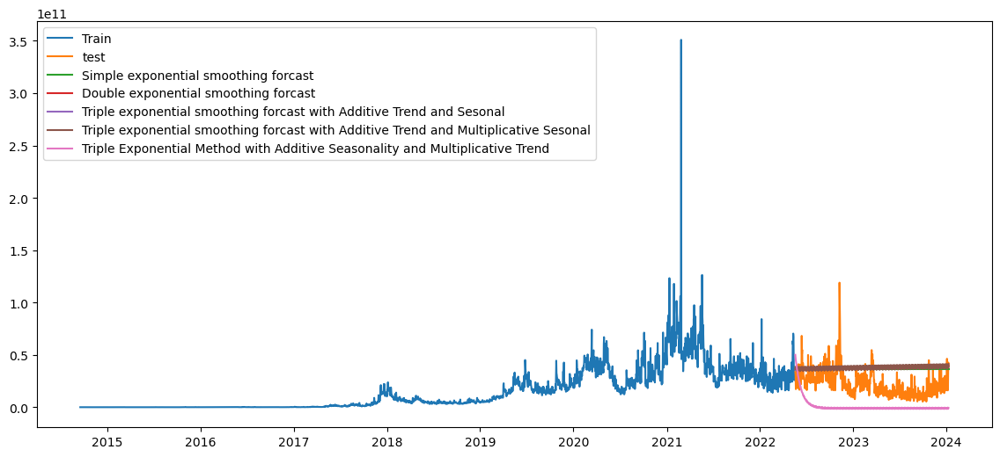

In [63]:
plt.figure(figsize=(14,6))
plt.plot(train_data, label='Train')
plt.plot(test_data, label='test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.plot(test_pred_dexp, label='Double exponential smoothing forcast')
plt.plot(test_pred_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Sesonal')
plt.plot(test_pred_mul_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Multiplicative Sesonal')
plt.plot(test_pred_ad_mul_texp, label='Triple Exponential Method with Additive Seasonality and Multiplicative Trend')
plt.legend(loc='best')
plt.show()

In [64]:
texp_mul_model  = ExponentialSmoothing(train_data,seasonal="mul",trend="mul",seasonal_periods=12).fit(optimized=True)
test_pred_mul_texp  = texp_mul_model.forecast(601)
train_pred_mul_texp  = texp_mul_model.fittedvalues
test_rmse_mul_texp  = sqrt(mean_squared_error(test_pred_mul_texp ,test_data.Volume))
train_rmse_mul_texp  = sqrt(mean_squared_error(train_pred_mul_texp ,train_data))
mape_mul_texp  = MAPE(test_pred_mul_texp,test_data.Volume)
print('Triple Exponential Method with multiplicative Trend and Seasonality',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_mul_texp ),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_mul_texp ),"\n",
'Test Root Mean Squared Error = {}'.format(test_rmse_mul_texp ))

D:\Anaconda baby\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

D:\Anaconda baby\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:83: RuntimeWarning:

overflow encountered in matmul



Triple Exponential Method with multiplicative Trend and Seasonality 
 Mean Absolute Percent Error = -1689.3517607688586 
 Train Root Mean Squared Error = 8228074959.214893 
 Test Root Mean Squared Error = 351747960382.3819


D:\Anaconda baby\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:917: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



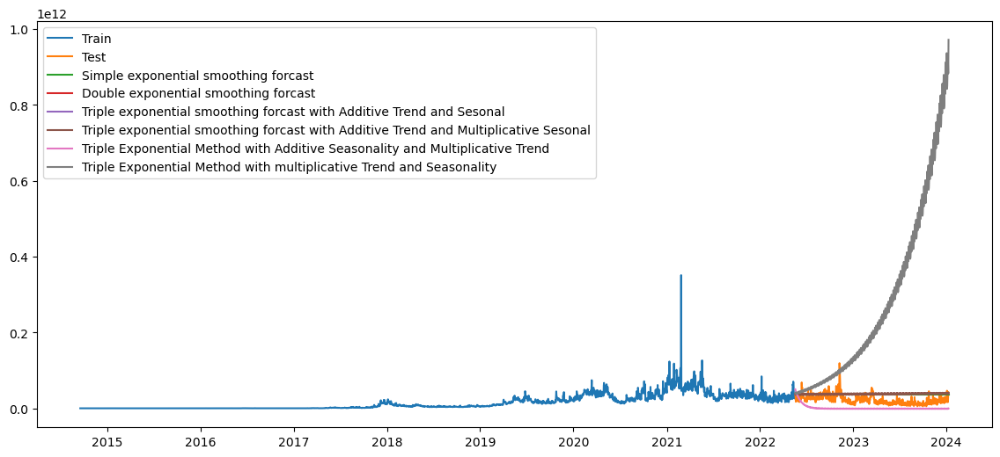

In [65]:
plt.figure(figsize=(14,6))
plt.plot(train_data, label='Train')
plt.plot(test_data, label='Test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.plot(test_pred_dexp, label='Double exponential smoothing forcast')
plt.plot(test_pred_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Sesonal')
plt.plot(test_pred_mul_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Multiplicative Sesonal')
plt.plot(test_pred_ad_mul_texp, label='Triple Exponential Method with Additive Seasonality and Multiplicative Trend')
plt.plot(test_pred_mul_texp, label='Triple Exponential Method with multiplicative Trend and Seasonality')
plt.legend(loc='best')
plt.show()

In [66]:
#Comparing the results 

Evaluation = {"Models":pd.Series(["Simple_Exp","Double_Exp","Triple_Exp_ad","Triple_Exp_mul_ad","Triple_Exp_ad_mul"\
                                  ,"Triple_Exp_mul"]),\
        "Train_RMSE":pd.Series([train_rmse_ses,train_rmse_dexp,train_rmse_ad_texp,train_rmse_mul_ad_texp,train_rmse_ad_mul_texp,train_rmse_mul_texp]),\
        "Test_MAPE(%)":pd.Series([mape_ses,mape_dexp,mape_ad_texp,mape_mul_ad_texp,mape_ad_mul_texp,mape_mul_texp]),\
        "Test_RMSE_Values":pd.Series([test_rmse_ses,test_rmse_dexp,test_rmse_ad_texp,test_rmse_mul_ad_texp,test_rmse_ad_mul_texp,test_rmse_mul_texp])}
table_evaluation=pd.DataFrame(Evaluation)
table_evaluation.sort_values(['Test_MAPE(%)'], inplace=True, ignore_index=True)
table_evaluation

,Models,Train_RMSE,Test_MAPE(%),Test_RMSE_Values
0,Triple_Exp_mul,8.228075e+09,-1689.351761,3.517480e+11
1,Double_Exp,8.065191e+09,-112.096858,1.956190e+10
2,Triple_Exp_mul_ad,8.114178e+09,-110.824506,1.942882e+10
3,Triple_Exp_ad,8.065311e+09,-109.599667,1.919137e+10
4,Simple_Exp,8.064823e+09,-101.533822,1.801156e+10
5,Triple_Exp_ad_mul,1.030082e+10,99.184261,2.592136e+10


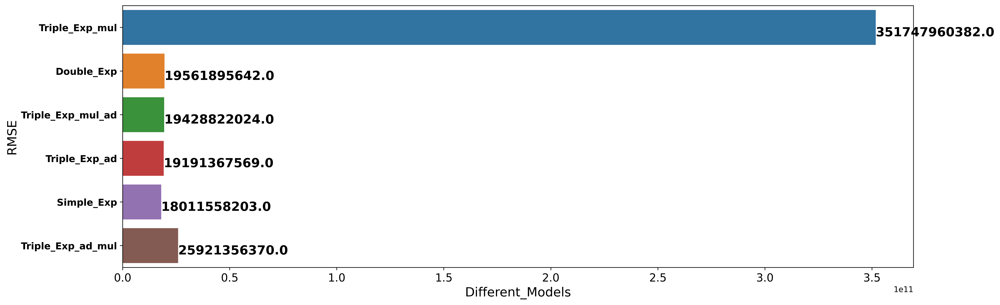

In [67]:
f, axe = plt.subplots(1,1, figsize=(18,6), dpi=500)
sns.barplot(x='Test_RMSE_Values', y='Models', data=table_evaluation, ax = axe)
axe.set_xlabel('Different_Models', size=16)
axe.set_ylabel('RMSE', size=16)
plt.yticks(fontsize=12,fontweight = 'bold')
plt.xticks(fontsize=14)


for i, v in enumerate(np.round(table_evaluation.Test_RMSE_Values.values,0)):
    axe.text(v + 1, i + .20, str(v),
            color = 'black', fontweight = 'bold', fontsize= 16)

plt.show()

In [68]:
def test_stationarity(timeseries):
    
    #Determine rolling statistics
    movingAverage = timeseries.rolling(window=12).mean()
    movingSTD = timeseries.rolling(window=12).std()
    
    #Plot rolling statistics
    orig = plt.plot(timeseries, color='blue', label='Original')
    mean = plt.plot(movingAverage, color='red', label='Rolling Mean')
    plt.legend(loc='best')
    plt.title('Rolling Mean')
    plt.show(block=False)
    
    #Perform Dickey–Fuller test:
    print('Results of Dickey Fuller Test:')
    dftest = adfuller(timeseries['Volume'], autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)

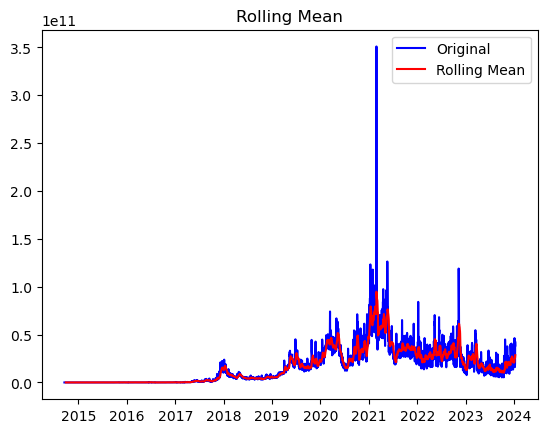

Results of Dickey Fuller Test:
Test Statistic                   -2.218756
p-value                           0.199509
#Lags Used                       29.000000
Number of Observations Used    3371.000000
Critical Value (1%)              -3.432291
Critical Value (5%)              -2.862398
Critical Value (10%)             -2.567227
dtype: float64


In [69]:
sales= pd.DataFrame()
sales['Volume'] = df1[['Volume']]
test_stationarity(sales)

In [70]:
from statsmodels.tsa.stattools import adfuller
def adf_test(series):    
    result = adfuller(series.dropna())  
    labels = ['ADF test statistic','p-value','# lags used','# observations']
    out = pd.Series(result[0:4],index=labels)
    #for key,val in result[4].items():
        #out[f'critical value ({key})']=val
    if result[1] <= 0.05:
        print("Reject the null hypothesis")
        print("Data is stationary")
    else:
        print("Fail to reject the null hypothesis")
        print("Data is non-stationary")

In [71]:
adf_test(sales)

Fail to reject the null hypothesis
Data is non-stationary


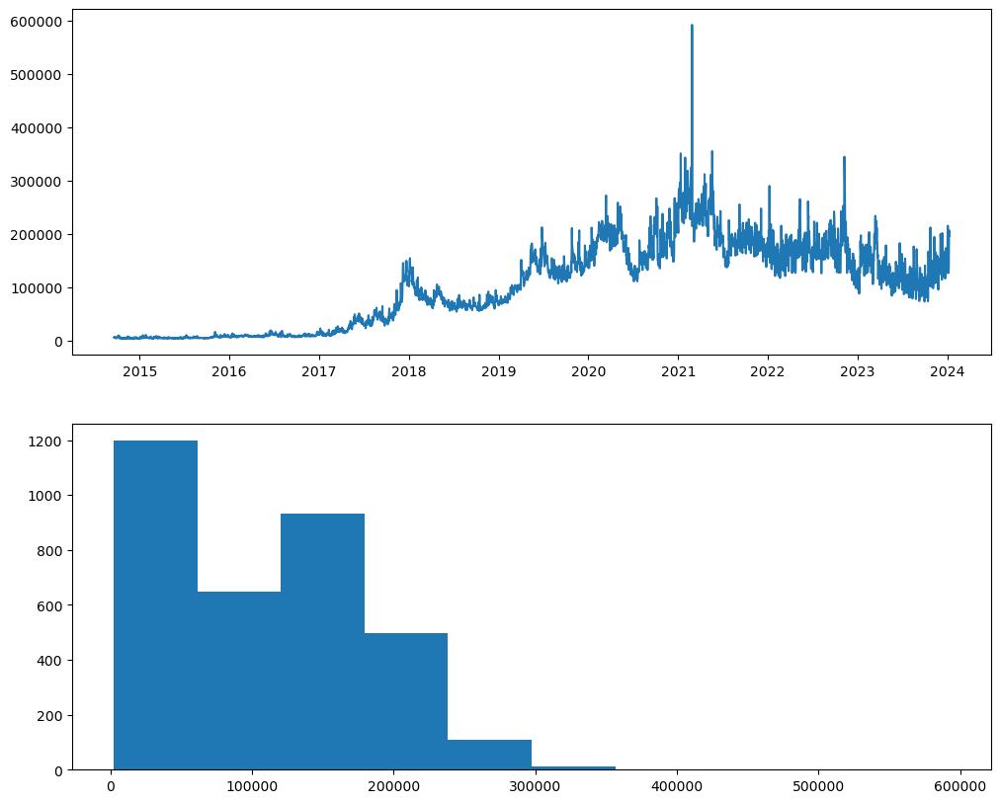

In [72]:
square_root= pd.DataFrame()
square_root = df1[['Volume']]
square_root['Volume'] = np.sqrt(square_root.Volume)

# line chart
fig=plt.figure(figsize=(12,10))
plt.subplot(211)
plt.plot(square_root['Volume'])
#Histogram
plt.subplot(212)
plt.hist(square_root['Volume'])
plt.show()

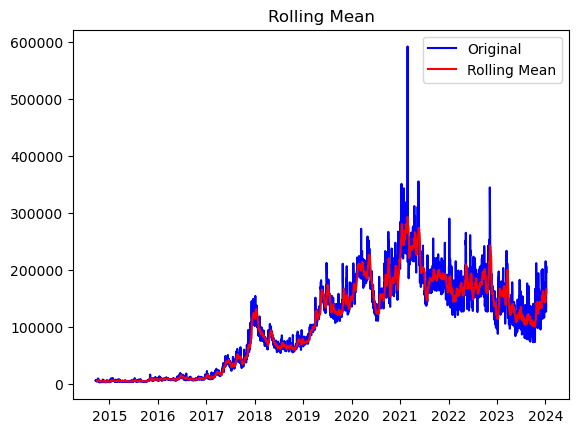

Results of Dickey Fuller Test:
Test Statistic                   -1.549832
p-value                           0.508732
#Lags Used                       29.000000
Number of Observations Used    3371.000000
Critical Value (1%)              -3.432291
Critical Value (5%)              -2.862398
Critical Value (10%)             -2.567227
dtype: float64


In [73]:
test_stationarity(square_root)

In [74]:
adf_test(square_root)

Fail to reject the null hypothesis
Data is non-stationary


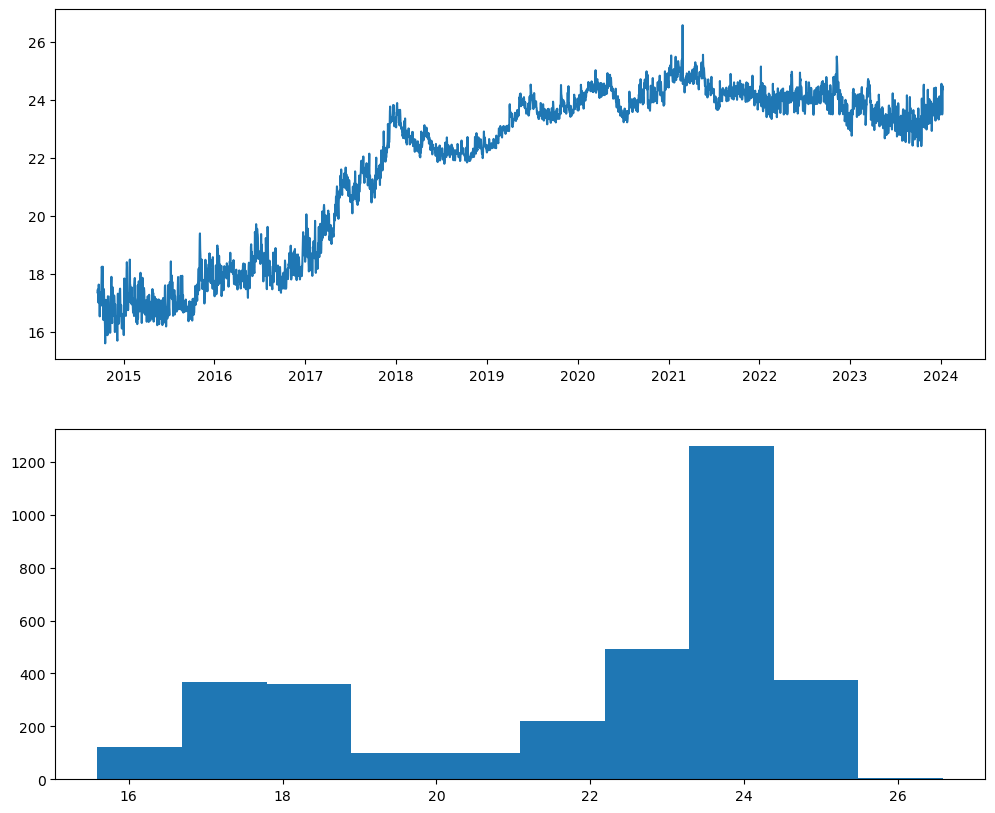

In [75]:
log = pd.DataFrame()
log = df1[['Volume']]
log['Volume'] = np.log(log.Volume)

# line chart
fig=plt.figure(figsize=(12,10))
plt.subplot(211)
plt.plot(log['Volume'])
#Histogram
plt.subplot(212)
plt.hist(log['Volume'])
plt.show()

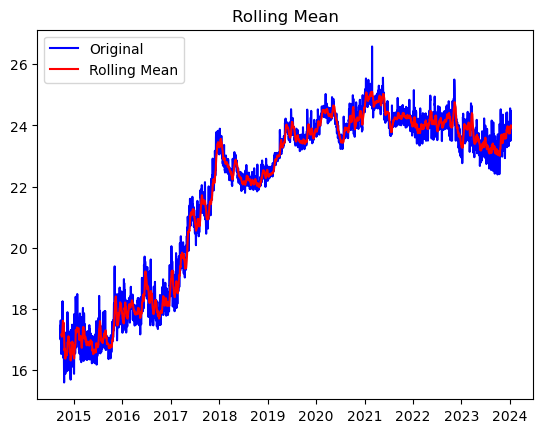

Results of Dickey Fuller Test:
Test Statistic                   -1.590862
p-value                           0.488182
#Lags Used                       29.000000
Number of Observations Used    3371.000000
Critical Value (1%)              -3.432291
Critical Value (5%)              -2.862398
Critical Value (10%)             -2.567227
dtype: float64


In [76]:
test_stationarity(log)

In [77]:
adf_test(log)

Fail to reject the null hypothesis
Data is non-stationary


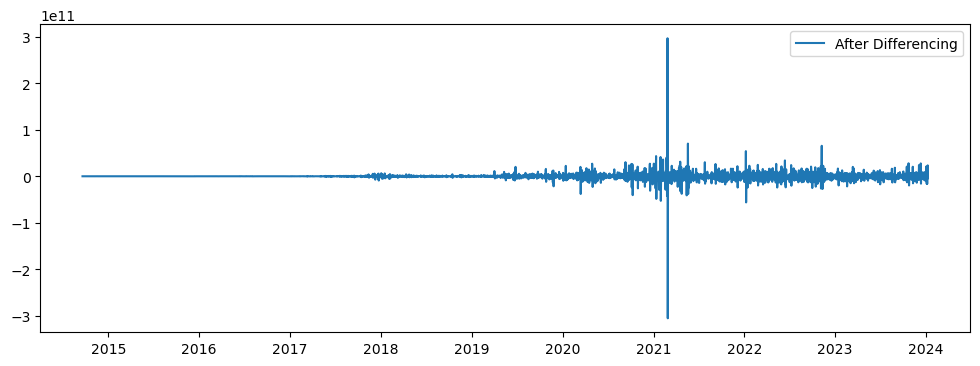

In [78]:
differencing = df1 - df1.shift(1)
differencing.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(differencing, label='After Differencing')
plt.legend(loc='best')
plt.show()

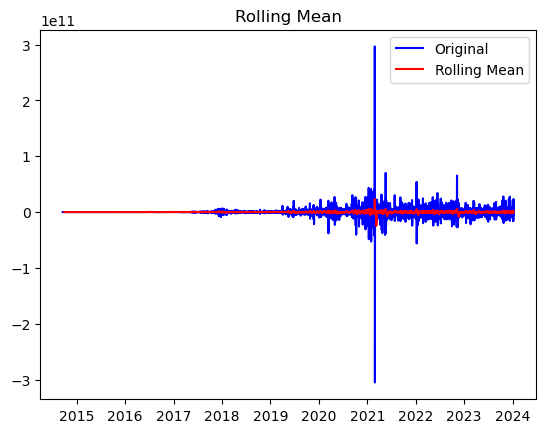

Results of Dickey Fuller Test:
Test Statistic                -1.523218e+01
p-value                        5.302604e-28
#Lags Used                     2.800000e+01
Number of Observations Used    3.371000e+03
Critical Value (1%)           -3.432291e+00
Critical Value (5%)           -2.862398e+00
Critical Value (10%)          -2.567227e+00
dtype: float64


In [79]:
test_stationarity(differencing)

In [80]:
adf_test(differencing)

Reject the null hypothesis
Data is stationary


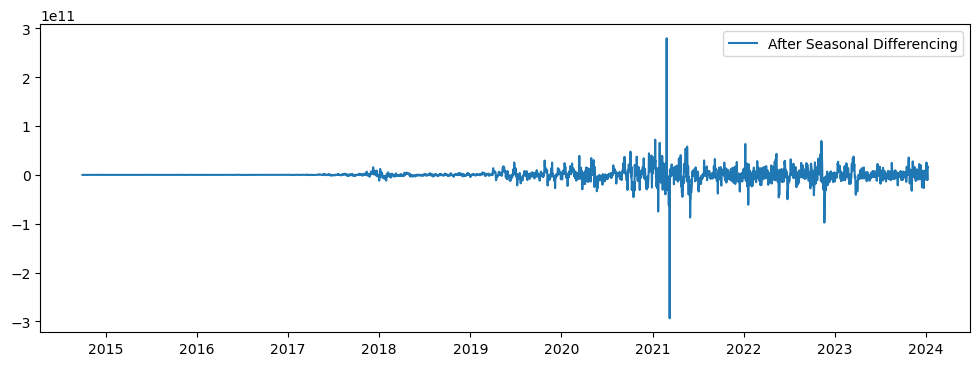

In [81]:
seasonal_differencing = df1 - df1.shift(12)
seasonal_differencing.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(seasonal_differencing, label='After Seasonal Differencing')
plt.legend(loc='best')
plt.show()

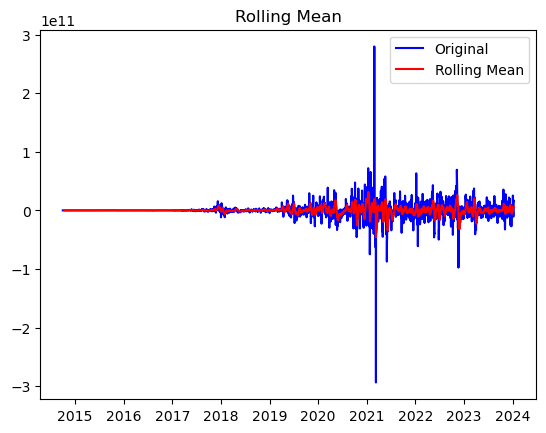

Results of Dickey Fuller Test:
Test Statistic                -1.163547e+01
p-value                        2.210330e-21
#Lags Used                     2.900000e+01
Number of Observations Used    3.359000e+03
Critical Value (1%)           -3.432298e+00
Critical Value (5%)           -2.862401e+00
Critical Value (10%)          -2.567228e+00
dtype: float64


In [82]:
test_stationarity(seasonal_differencing)

In [83]:
adf_test(seasonal_differencing)

Reject the null hypothesis
Data is stationary


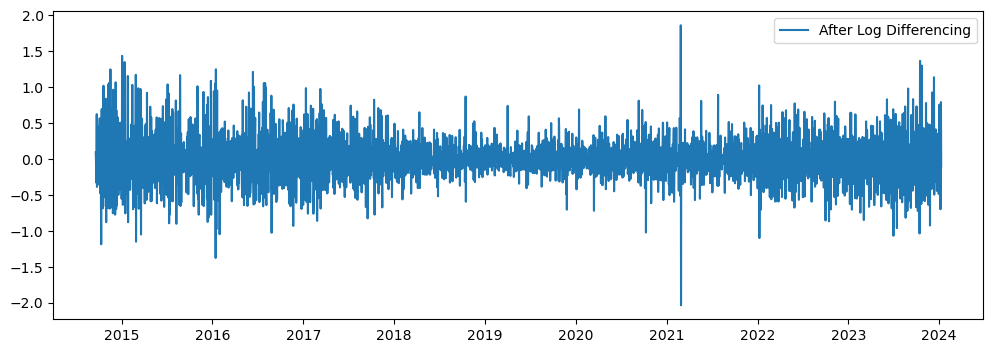

In [84]:
log_diff = log - log.shift(1)
log_diff.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(log_diff, label='After Log Differencing')
plt.legend(loc='best')
plt.show()

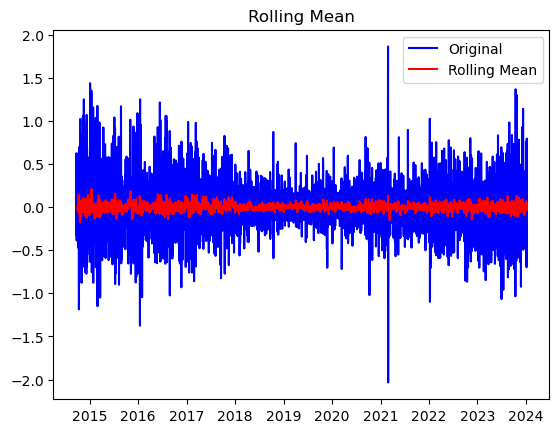

Results of Dickey Fuller Test:
Test Statistic                -1.349289e+01
p-value                        3.081527e-25
#Lags Used                     2.800000e+01
Number of Observations Used    3.371000e+03
Critical Value (1%)           -3.432291e+00
Critical Value (5%)           -2.862398e+00
Critical Value (10%)          -2.567227e+00
dtype: float64


In [85]:
test_stationarity(log_diff)

In [86]:
adf_test(log_diff)

Reject the null hypothesis
Data is stationary


,Volume
Date,
2014-09-18,17.355983
2014-09-19,17.450981
2014-09-20,17.422735
2014-09-21,17.095673
2014-09-22,16.998867


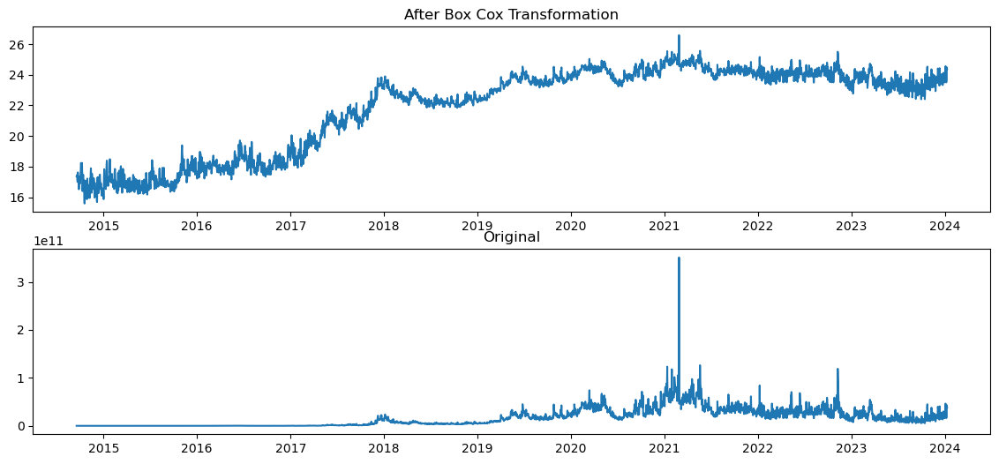

In [87]:
data_boxcox = pd.DataFrame()
data_boxcox['Volume'] = pd.Series(boxcox(df1['Volume'], lmbda=0), df1.index)
display(data_boxcox.head())
fig, axis = plt.subplots(2,figsize=(14,6),)
axis[0].plot(data_boxcox)
axis[0].set_title('After Box Cox Transformation')
axis[1].plot(df1, label='original')
axis[1].set_title('Original')
plt.show()

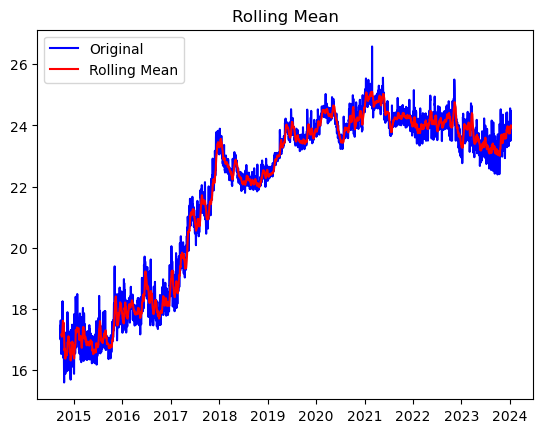

Results of Dickey Fuller Test:
Test Statistic                   -1.590862
p-value                           0.488182
#Lags Used                       29.000000
Number of Observations Used    3371.000000
Critical Value (1%)              -3.432291
Critical Value (5%)              -2.862398
Critical Value (10%)             -2.567227
dtype: float64


In [88]:
test_stationarity(data_boxcox)

In [89]:
adf_test(data_boxcox)

Fail to reject the null hypothesis
Data is non-stationary


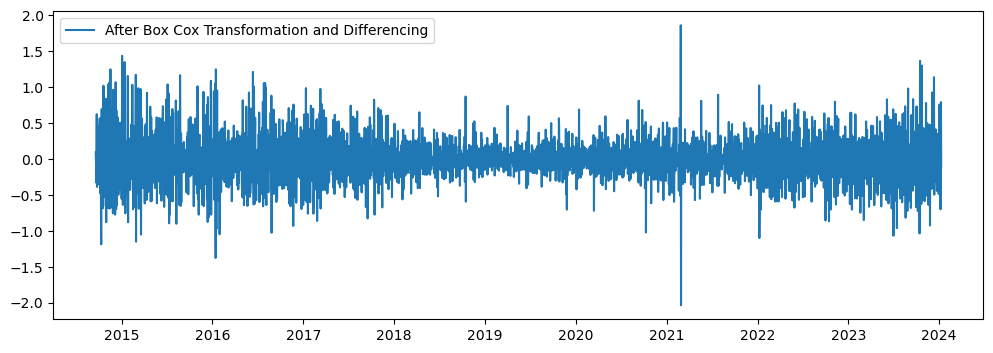

In [90]:
# data_boxcox - data_boxcox.shift() :- Performs difference between the previous and current observations.
#data_boxcox_diff = data_boxcox - data_boxcox.shift()
data_boxcox_diff = data_boxcox - data_boxcox.shift()
data_boxcox_diff.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(data_boxcox_diff, label='After Box Cox Transformation and Differencing')
plt.legend(loc='best')
plt.show()

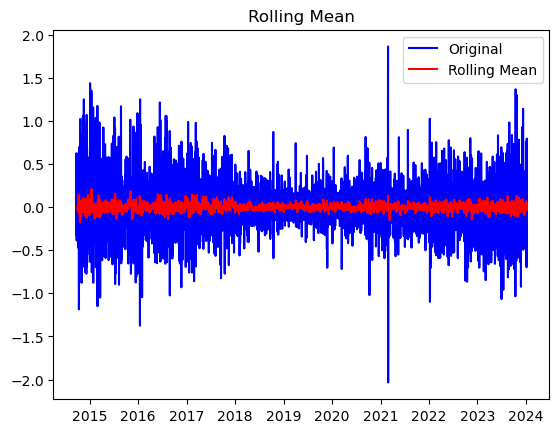

Results of Dickey Fuller Test:
Test Statistic                -1.349289e+01
p-value                        3.081527e-25
#Lags Used                     2.800000e+01
Number of Observations Used    3.371000e+03
Critical Value (1%)           -3.432291e+00
Critical Value (5%)           -2.862398e+00
Critical Value (10%)          -2.567227e+00
dtype: float64


In [91]:
test_stationarity(data_boxcox_diff)

In [92]:
adf_test(data_boxcox_diff)

Reject the null hypothesis
Data is stationary


In [93]:
train_data_boxcox = data_boxcox[:size]
test_data_boxcox = data_boxcox[size:]
train_data_boxcox_diff = data_boxcox_diff[:size]
test_data_boxcox_diff = data_boxcox_diff[size:]

In [94]:
# grid search ARIMA parameters for a time series

# evaluate an ARIMA model for a given order (p,d,q) and return RMSE
def evaluate_arima_model(X, arima_order):
# prepare training dataset
    X = X.astype('float32')
    train_size = int(len(X) * 0.70)
    train, test = X[0:train_size], X[train_size:]
    history = [x for x in train]
# make predictions
    predictions = list()
    for t in range(len(test)):
        model = ARIMA(history, order=arima_order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test[t])
# calculate out of sample error
    rmse = sqrt(mean_squared_error(test, predictions))
    return rmse

In [95]:
# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_models(dataset, p_values, d_values, q_values):
    dataset = dataset.astype('float32')
    best_score, best_cfg = float('inf'), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q)
                try:
                    rmse = evaluate_arima_model(dataset, order)
                    if rmse < best_score:
                        best_score, best_cfg = rmse, order
                    #print('ARIMA%s RMSE=%.3f' % (order,rmse))
                except Exception as e:
                    print(e)
                    continue
    print('Best ARIMA%s RMSE=%.3f' % (best_cfg, best_score))

In [96]:
# evaluate parameters
#p_values = range(0, 5)
#d_values = range(0, 5)
#q_values = range(0, 5)
#evaluate_models(data_boxcox_diff.Passengers, p_values, d_values, q_values)

In [97]:
model = ARIMA(train_data_boxcox_diff, order=(1, 1, 1))
model_fit = model.fit()
y_hat_ar = data_boxcox_diff.copy()
y_hat_ar['arima_forecast'] = model_fit.predict(data_boxcox_diff.index.min(), data_boxcox_diff.index.max())
# We did differencing. So we need to revert it by adding the consecutive observations.
# For that we are using cumsum() method
y_hat_ar['arima_forecast'] = y_hat_ar['arima_forecast'].cumsum()
# We removed the first observations after differencing as it was null. Hence, adding the first observation back.
y_hat_ar['arima_forecast'] = y_hat_ar['arima_forecast'].add(data_boxcox.Volume[0])
# Now doing the reverse transformation 
# We have done Box Cox Log Log transformation with lambda = 0
# Hence, we have to the exponential as it is the reverse of the log.
y_hat_ar['arima_forecast'] = np.exp(y_hat_ar['arima_forecast'])

D:\Anaconda baby\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

D:\Anaconda baby\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

D:\Anaconda baby\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



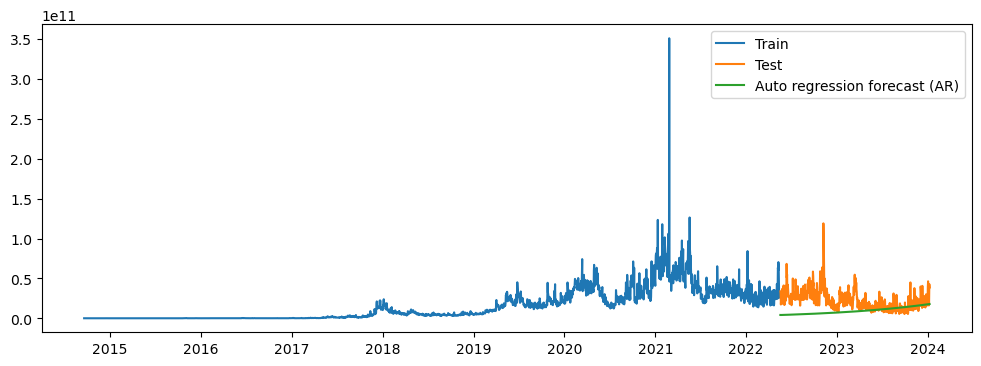

In [98]:
plt.figure(figsize=(12,4))
plt.plot(train_data['Volume'], label='Train')
plt.plot(test_data, label='Test')
plt.plot(y_hat_ar['arima_forecast'][test_data.index.min():], label='Auto regression forecast (AR)')
plt.legend(loc='best')
plt.show()

In [99]:
rmse_ARIMA = np.sqrt(mean_squared_error(test_data, y_hat_ar['arima_forecast'][test_data.index.min():])).round(2)
rmse_ARIMA

19960199747.69

In [100]:
mape_arima = round(np.mean(np.abs((test_data.Volume - y_hat_ar['arima_forecast'][test_data.index.min():])/test_data.Volume)*100),2)
mape_arima

54.75

In [101]:
model_residual = model_fit.resid
model_residual.mean()

0.0007477554363098423

In [102]:
adf_test(model_residual)

Reject the null hypothesis
Data is stationary


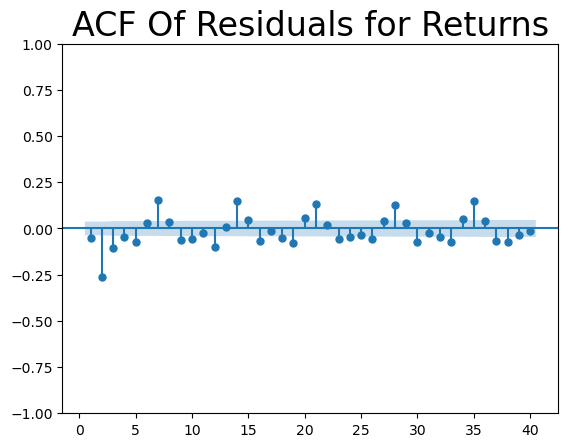

In [103]:
plot_acf(model_residual, zero = False, lags = 40)
plt.title("ACF Of Residuals for Returns",size=24)
plt.show()

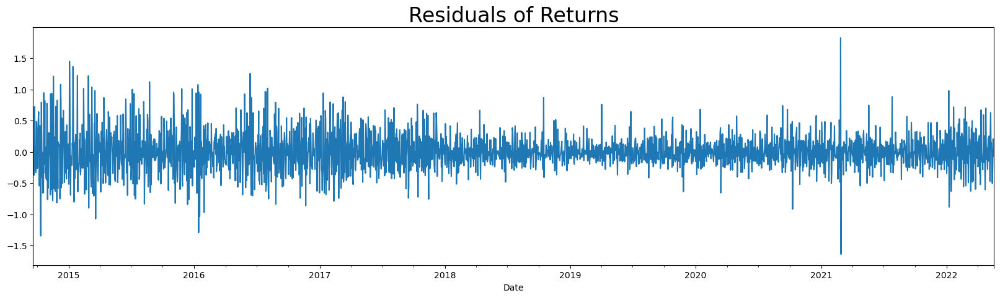

In [104]:
model_residual.plot(figsize=(20,5))
plt.title("Residuals of Returns", size=24)
plt.show()

In [105]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
model = SARIMAX(train_data_boxcox, order=(1,1,2), seasonal_order=(1,1,1,12))
model_fit= model.fit()
y_hat_sarima = data_boxcox_diff.copy()

D:\Anaconda baby\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

D:\Anaconda baby\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



In [106]:
y_hat_sarima['sarima_forecast_boxcox'] = model_fit.predict(data_boxcox_diff.index.min(), data_boxcox_diff.index.max())
y_hat_sarima['sarima_forecast'] = np.exp(y_hat_sarima['sarima_forecast_boxcox'])
y_hat_sarima['sarima_forecast'] = np.exp(y_hat_sarima['sarima_forecast_boxcox'])

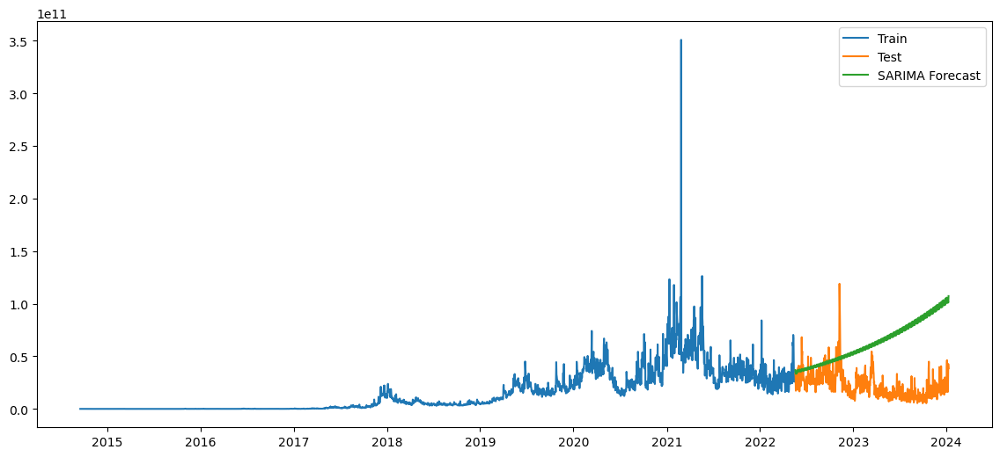

In [107]:
plt.figure(figsize=(14,6))
plt.plot(train_data['Volume'], label='Train')
plt.plot(test_data, label='Test')
plt.plot(y_hat_sarima['sarima_forecast'][test_data.index.min():], label='SARIMA Forecast')
plt.legend(loc='best')
plt.show()

In [108]:
rmse_SARIMA = np.sqrt(mean_squared_error(test_data, y_hat_sarima['sarima_forecast'][test_data.index.min():])).round(2)
rmse_SARIMA

48931996440.47

In [109]:
mape_sarima = round(np.mean(np.abs((test_data.Volume - y_hat_sarima['sarima_forecast'][test_data.index.min():])/test_data.Volume)*100),2)
mape_sarima

281.34

In [110]:
model_residual = model_fit.resid
model_residual.mean()

0.004945824891799144

In [111]:
adf_test(model_residual)

Reject the null hypothesis
Data is stationary


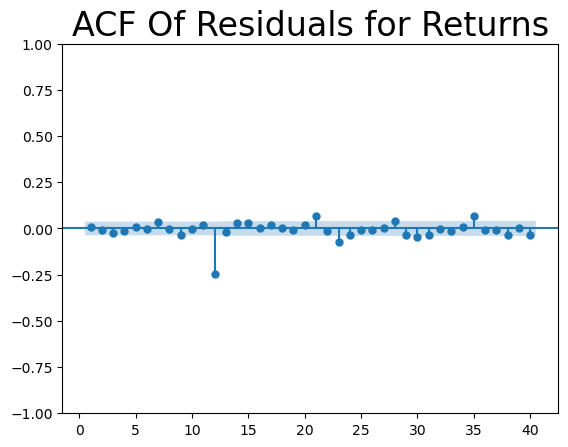

In [112]:
plot_acf(model_residual, zero = False, lags = 40)
plt.title("ACF Of Residuals for Returns",size=24)
plt.show()

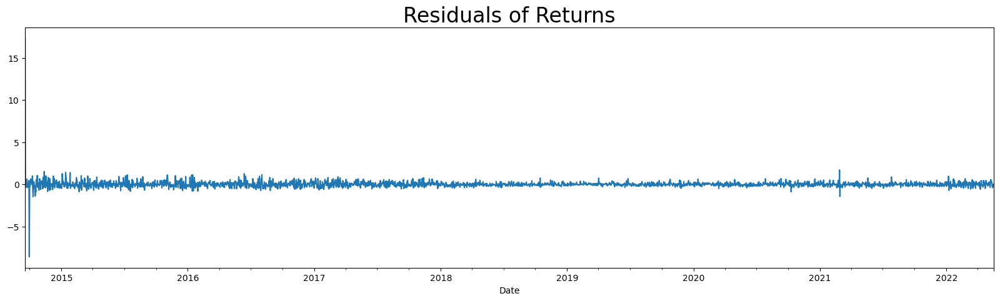

In [113]:
model_residual.plot(figsize=(20,5))
plt.title("Residuals of Returns", size=24)
plt.show()

In [114]:
#Compareing the results 

Evaluation = {"Models":pd.Series(["Simple_Exponential","Double_Exponential","Triple_Exp_additive","Triple_Exp_mul_ad","Triple_Exp_ad_mul"\
                                  ,"Triple_Exp_multiplicative","ARIMA","SARIMA"]),\
        "MAPE(%)":pd.Series([mape_ses,mape_dexp,mape_ad_texp,mape_mul_ad_texp,mape_ad_mul_texp,mape_mul_texp,mape_arima,mape_sarima]),\
        "RMSE_Values":pd.Series([test_rmse_ses,test_rmse_dexp,test_rmse_ad_texp,test_rmse_mul_ad_texp,test_rmse_ad_mul_texp,test_rmse_mul_texp,rmse_ARIMA,rmse_SARIMA])}
table_evaluation=pd.DataFrame(Evaluation)
table_evaluation.sort_values(['RMSE_Values'], inplace=True, ignore_index=True)
table_evaluation

,Models,MAPE(%),RMSE_Values
0,Simple_Exponential,-101.533822,1.801156e+10
1,Triple_Exp_additive,-109.599667,1.919137e+10
2,Triple_Exp_mul_ad,-110.824506,1.942882e+10
3,Double_Exponential,-112.096858,1.956190e+10
4,ARIMA,54.750000,1.996020e+10
5,Triple_Exp_ad_mul,99.184261,2.592136e+10
6,SARIMA,281.340000,4.893200e+10
7,Triple_Exp_multiplicative,-1689.351761,3.517480e+11


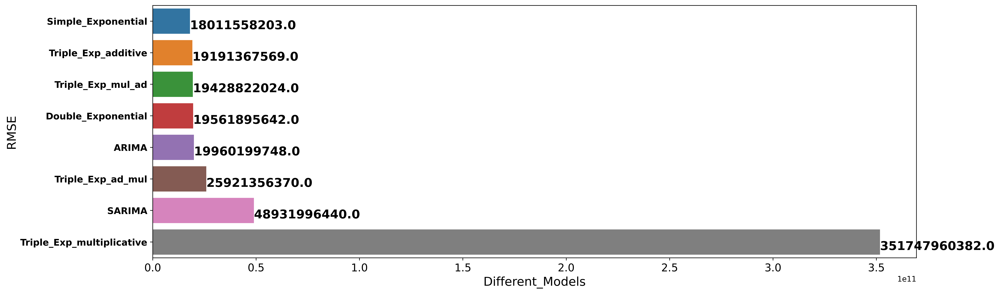

In [115]:
f, axe = plt.subplots(1,1, figsize=(18,6), dpi=500)
sns.barplot(x='RMSE_Values', y='Models', data=table_evaluation, ax = axe)
axe.set_xlabel('Different_Models', size=16)
axe.set_ylabel('RMSE', size=16)
plt.yticks(fontsize=12,fontweight = 'bold')
plt.xticks(fontsize=14)


for i, v in enumerate(np.round(table_evaluation.RMSE_Values.values,0)):
    axe.text(v + 3, i + .25, str(v),
            color = 'black', fontweight = 'bold', fontsize= 16)

plt.show()

In [116]:
df2 = df1.copy()
df2.reset_index(inplace=True)
df2['t'] = np.arange(1,len(df2)+1)
df2['t_squared'] = np.square(df2.t)
df2["month"] = df2.Date.dt.strftime("%b") # month extraction
df2["year"] = df2.Date.dt.strftime("%Y") # year extraction
months = pd.get_dummies(df2['month'])
months = months[['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']]
df2 = pd.concat([df2,months],axis=1)
df2['log_Volume'] = np.log(df2['Volume'])
df2

,Date,Volume,t,t_squared,month,year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,log_Volume
0,2014-09-18,3.448320e+07,1,1,Sep,2014,False,False,False,False,False,False,False,False,True,False,False,False,17.355983
1,2014-09-19,3.791970e+07,2,4,Sep,2014,False,False,False,False,False,False,False,False,True,False,False,False,17.450981
2,2014-09-20,3.686360e+07,3,9,Sep,2014,False,False,False,False,False,False,False,False,True,False,False,False,17.422735
3,2014-09-21,2.658010e+07,4,16,Sep,2014,False,False,False,False,False,False,False,False,True,False,False,False,17.095673
4,2014-09-22,2.412760e+07,5,25,Sep,2014,False,False,False,False,False,False,False,False,True,False,False,False,16.998867
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3396,2024-01-05,3.233603e+10,3397,11539609,Jan,2024,True,False,False,False,False,False,False,False,False,False,False,False,24.199448
3397,2024-01-06,1.609250e+10,3398,11546404,Jan,2024,True,False,False,False,False,False,False,False,False,False,False,False,23.501619
3398,2024-01-07,1.933057e+10,3399,11553201,Jan,2024,True,False,False,False,False,False,False,False,False,False,False,False,23.684954
3399,2024-01-08,4.274619e+10,3400,11560000,Jan,2024,True,False,False,False,False,False,False,False,False,False,False,False,24.478546


In [117]:
train_data = df2.iloc[:size]
test_data = df2.iloc[size:]

In [118]:
train_data

,Date,Volume,t,t_squared,month,year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,log_Volume
0,2014-09-18,3.448320e+07,1,1,Sep,2014,False,False,False,False,False,False,False,False,True,False,False,False,17.355983
1,2014-09-19,3.791970e+07,2,4,Sep,2014,False,False,False,False,False,False,False,False,True,False,False,False,17.450981
2,2014-09-20,3.686360e+07,3,9,Sep,2014,False,False,False,False,False,False,False,False,True,False,False,False,17.422735
3,2014-09-21,2.658010e+07,4,16,Sep,2014,False,False,False,False,False,False,False,False,True,False,False,False,17.095673
4,2014-09-22,2.412760e+07,5,25,Sep,2014,False,False,False,False,False,False,False,False,True,False,False,False,16.998867
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2795,2022-05-14,2.857987e+10,2796,7817616,May,2022,False,False,False,False,True,False,False,False,False,False,False,False,24.075968
2796,2022-05-15,2.583537e+10,2797,7823209,May,2022,False,False,False,False,True,False,False,False,False,False,False,False,23.975010
2797,2022-05-16,3.261390e+10,2798,7828804,May,2022,False,False,False,False,True,False,False,False,False,False,False,False,24.208004
2798,2022-05-17,2.910147e+10,2799,7834401,May,2022,False,False,False,False,True,False,False,False,False,False,False,False,24.094055


In [119]:
#Linear Model
import statsmodels.formula.api as smf 
linear_model = smf.ols('Volume~t',data=train_data).fit()
pred_linear =  pd.Series(linear_model.predict(pd.DataFrame(test_data['t'])))
rmse_linear = np.sqrt(np.mean((np.array(test_data['Volume'])-np.array(pred_linear))**2))
rmse_linear

27402405561.77597

In [120]:
linear_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 Volume   R-squared:                       0.562
Model:                            OLS   Adj. R-squared:                  0.562
Method:                 Least Squares   F-statistic:                     3596.
Date:                Sun, 14 Jan 2024   Prob (F-statistic):               0.00
Time:                        00:26:11   Log-Likelihood:                -69223.
No. Observations:                2800   AIC:                         1.384e+05
Df Residuals:                    2798   BIC:                         1.385e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -1.075e+10   4.99e+08    -21.528      0.000   -1.17e+10   -9.77e+09
t           1.851e+07   3.09e+05     59.965      0.000    1.79e+07    1.91e+07
==============================================================================
Omnibus:                     3551.056   Durbin-Watson:                   0.574
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1816069.722
Skew:                           6.382   Prob(JB):                         0.00
Kurtosis:                     127.110   Cond. No.                     3.23e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.23e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [121]:
Exp = smf.ols('log_Volume~t',data=train_data).fit()
pred_Exp = pd.Series(Exp.predict(pd.DataFrame(test_data['t'])))
rmse_Exp = np.sqrt(np.mean((np.array(test_data['Volume'])-np.array(np.exp(pred_Exp)))**2))
rmse_Exp

776897373889.9099

In [122]:
Exp.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             log_Volume   R-squared:                       0.875
Model:                            OLS   Adj. R-squared:                  0.875
Method:                 Least Squares   F-statistic:                 1.963e+04
Date:                Sun, 14 Jan 2024   Prob (F-statistic):               0.00
Time:                        00:26:11   Log-Likelihood:                -4011.8
No. Observations:                2800   AIC:                             8028.
Df Residuals:                    2798   BIC:                             8040.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     16.8004      0.038    438.104      0.000      16.725      16.876
t              0.0033   2.37e-05    140.109      0.000       0.003       0.003
==============================================================================
Omnibus:                       30.685   Durbin-Watson:                   0.089
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               21.026
Skew:                           0.082   Prob(JB):                     2.72e-05
Kurtosis:                       2.608   Cond. No.                     3.23e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.23e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [123]:
Quad = smf.ols('Volume~t+t_squared',data=train_data).fit()
pred_Quad = pd.Series(Quad.predict(test_data[["t","t_squared"]]))
rmse_Quad = np.sqrt(np.mean((np.array(test_data['Volume'])-np.array(pred_Quad))**2))
rmse_Quad

40639397627.94286

In [124]:
Quad.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 Volume   R-squared:                       0.593
Model:                            OLS   Adj. R-squared:                  0.593
Method:                 Least Squares   F-statistic:                     2040.
Date:                Sun, 14 Jan 2024   Prob (F-statistic):               0.00
Time:                        00:26:11   Log-Likelihood:                -69120.
No. Observations:                2800   AIC:                         1.382e+05
Df Residuals:                    2797   BIC:                         1.383e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -2.89e+09   7.22e+08     -4.001      0.000   -4.31e+09   -1.47e+09
t           1.689e+06   1.19e+06      1.418      0.156   -6.47e+05    4.02e+06
t_squared   6006.9718    411.763     14.588      0.000    5199.582    6814.361
==============================================================================
Omnibus:                     3688.601   Durbin-Watson:                   0.617
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          2343065.396
Skew:                           6.799   Prob(JB):                         0.00
Kurtosis:                     144.062   Cond. No.                     1.05e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.05e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [125]:
add_sea = smf.ols('Volume~Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Oct+Nov+Dec',data=train_data).fit()
pred_add_sea = pd.Series(add_sea.predict(test_data[['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']]))
rmse_add_sea = np.sqrt(np.mean((np.array(test_data['Volume'])-np.array(pred_add_sea))**2))
rmse_add_sea

15664555725.929731

In [126]:
add_sea.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 Volume   R-squared:                       0.031
Model:                            OLS   Adj. R-squared:                  0.028
Method:                 Least Squares   F-statistic:                     8.224
Date:                Sun, 14 Jan 2024   Prob (F-statistic):           2.42e-14
Time:                        00:26:12   Log-Likelihood:                -70335.
No. Observations:                2800   AIC:                         1.407e+05
Df Residuals:                    2788   BIC:                         1.408e+05
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept    1.394e+10   3.44e+08     40.541      0.000    1.33e+10    1.46e+10
Jan[T.True]  4.292e+09    1.2e+09      3.577      0.000    1.94e+09    6.64e+09
Feb[T.True]  6.135e+09   1.25e+09      4.898      0.000    3.68e+09    8.59e+09
Mar[T.True]   3.43e+09    1.2e+09      2.858      0.004    1.08e+09    5.78e+09
Apr[T.True]  4.744e+09   1.22e+09      3.895      0.000    2.36e+09    7.13e+09
May[T.True]  7.073e+09   1.23e+09      5.750      0.000    4.66e+09    9.48e+09
Jun[T.True] -1.102e+09    1.3e+09     -0.851      0.395   -3.64e+09    1.44e+09
Jul[T.True] -3.713e+09   1.28e+09     -2.909      0.004   -6.22e+09   -1.21e+09
Aug[T.True] -2.623e+09   1.28e+09     -2.055      0.040   -5.12e+09    -1.2e+08
Sep[T.True] -1.176e+09   1.26e+09     -0.933      0.351   -3.65e+09     1.3e+09
Oct[T.True] -1.928e+09    1.2e+09     -1.607      0.108   -4.28e+09    4.25e+08
Nov[T.True] -9.098e+08   1.22e+09     -0.747      0.455    -3.3e+09    1.48e+09
Dec[T.True] -2.795e+08    1.2e+09     -0.233      0.816   -2.63e+09    2.07e+09
==============================================================================
Omnibus:                     2005.960   Durbin-Watson:                   0.260
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           106454.480
Skew:                           2.817   Prob(JB):                         0.00
Kurtosis:                      32.677   Cond. No.                     1.30e+15
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.79e-27. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [127]:
add_sea_Quad = smf.ols('Volume~t+t_squared+Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Oct+Nov+Dec',data=train_data).fit()
pred_add_sea_quad = pd.Series(add_sea_Quad.predict(test_data[['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec','t','t_squared']]))
rmse_add_sea_quad = np.sqrt(np.mean((np.array(test_data['Volume'])-np.array(pred_add_sea_quad))**2))
rmse_add_sea_quad

39285963496.82629

In [128]:
add_sea_Quad.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 Volume   R-squared:                       0.613
Model:                            OLS   Adj. R-squared:                  0.611
Method:                 Least Squares   F-statistic:                     339.1
Date:                Sun, 14 Jan 2024   Prob (F-statistic):               0.00
Time:                        00:26:12   Log-Likelihood:                -69052.
No. Observations:                2800   AIC:                         1.381e+05
Df Residuals:                    2786   BIC:                         1.382e+05
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept   -2.949e+09   6.56e+08     -4.493      0.000   -4.24e+09   -1.66e+09
Jan[T.True]  2.614e+09    7.6e+08      3.440      0.001    1.12e+09     4.1e+09
Feb[T.True]  3.944e+09   7.93e+08      4.971      0.000    2.39e+09     5.5e+09
Mar[T.True]  6.426e+08   7.61e+08      0.845      0.398   -8.49e+08    2.13e+09
Apr[T.True]   1.37e+09   7.73e+08      1.772      0.076   -1.46e+08    2.89e+09
May[T.True]   4.81e+09   7.81e+08      6.163      0.000    3.28e+09    6.34e+09
Jun[T.True] -1.248e+09   8.25e+08     -1.514      0.130   -2.86e+09    3.69e+08
Jul[T.True] -4.414e+09   8.13e+08     -5.432      0.000   -6.01e+09   -2.82e+09
Aug[T.True] -3.899e+09   8.13e+08     -4.796      0.000   -5.49e+09    -2.3e+09
Sep[T.True] -1.937e+09   7.99e+08     -2.423      0.015    -3.5e+09    -3.7e+08
Oct[T.True] -1.962e+09   7.59e+08     -2.584      0.010   -3.45e+09   -4.73e+08
Nov[T.True] -1.478e+09   7.71e+08     -1.917      0.055   -2.99e+09    3.39e+07
Dec[T.True] -1.392e+09    7.6e+08     -1.833      0.067   -2.88e+09    9.69e+07
t            2.426e+06   1.17e+06      2.069      0.039    1.26e+05    4.73e+06
t_squared    5706.2297    405.538     14.071      0.000    4911.045    6501.415
==============================================================================
Omnibus:                     3686.124   Durbin-Watson:                   0.651
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          2549277.668
Skew:                           6.755   Prob(JB):                         0.00
Kurtosis:                     150.202   Cond. No.                     5.06e+18
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.34e-21. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [129]:
Mul_sea = smf.ols('log_Volume~Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Oct+Nov+Dec',data = train_data).fit()
pred_Mult_sea = pd.Series(Mul_sea.predict(test_data))
rmse_Mult_sea = np.sqrt(np.mean((np.array(test_data['Volume'])-np.array(np.exp(pred_Mult_sea)))**2))
rmse_Mult_sea

24496024605.399666

In [130]:
Mul_sea.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             log_Volume   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     1.672
Date:                Sun, 14 Jan 2024   Prob (F-statistic):             0.0737
Time:                        00:26:12   Log-Likelihood:                -6916.6
No. Observations:                2800   AIC:                         1.386e+04
Df Residuals:                    2788   BIC:                         1.393e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      19.8047      0.050    395.241      0.000      19.706      19.903
Jan[T.True]     1.7566      0.175     10.047      0.000       1.414       2.099
Feb[T.True]     1.7452      0.182      9.564      0.000       1.387       2.103
Mar[T.True]     1.8841      0.175     10.777      0.000       1.541       2.227
Apr[T.True]     1.8791      0.177     10.588      0.000       1.531       2.227
May[T.True]     1.9882      0.179     11.094      0.000       1.637       2.340
Jun[T.True]     1.7298      0.189      9.163      0.000       1.360       2.100
Jul[T.True]     1.6063      0.186      8.639      0.000       1.242       1.971
Aug[T.True]     1.6815      0.186      9.043      0.000       1.317       2.046
Sep[T.True]     1.4127      0.184      7.694      0.000       1.053       1.773
Oct[T.True]     1.1399      0.175      6.520      0.000       0.797       1.483
Nov[T.True]     1.4273      0.177      8.042      0.000       1.079       1.775
Dec[T.True]     1.5541      0.175      8.889      0.000       1.211       1.897
==============================================================================
Omnibus:                   111495.042   Durbin-Watson:                   0.011
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              321.775
Skew:                          -0.488   Prob(JB):                     1.34e-70
Kurtosis:                       1.657   Cond. No.                     1.30e+15
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.79e-27. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [131]:
#Multiplicative Additive Seasonality 
Mul_Add_sea = smf.ols('log_Volume~t+Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Oct+Nov+Dec',data = train_data).fit()
pred_Mult_add_sea = pd.Series(Mul_Add_sea.predict(test_data))
rmse_Mult_add_sea = np.sqrt(np.mean((np.array(test_data['Volume'])-np.array(np.exp(pred_Mult_add_sea)))**2))
rmse_Mult_add_sea 

763988334936.8511

In [132]:
Mul_Add_sea.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             log_Volume   R-squared:                       0.877
Model:                            OLS   Adj. R-squared:                  0.876
Method:                 Least Squares   F-statistic:                     1653.
Date:                Sun, 14 Jan 2024   Prob (F-statistic):               0.00
Time:                        00:26:12   Log-Likelihood:                -3994.3
No. Observations:                2800   AIC:                             8015.
Df Residuals:                    2787   BIC:                             8092.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      15.5124      0.035    439.240      0.000      15.443      15.582
Jan[T.True]     1.4026      0.062     22.759      0.000       1.282       1.523
Feb[T.True]     1.2982      0.064     20.175      0.000       1.172       1.424
Mar[T.True]     1.3334      0.062     21.611      0.000       1.212       1.454
Apr[T.True]     1.2272      0.063     19.578      0.000       1.104       1.350
May[T.True]     1.4715      0.063     23.272      0.000       1.347       1.595
Jun[T.True]     1.4816      0.067     22.274      0.000       1.351       1.612
Jul[T.True]     1.2568      0.066     19.177      0.000       1.128       1.385
Aug[T.True]     1.2291      0.066     18.746      0.000       1.101       1.358
Sep[T.True]     1.1402      0.065     17.623      0.000       1.013       1.267
Oct[T.True]     1.0914      0.062     17.723      0.000       0.971       1.212
Nov[T.True]     1.2775      0.063     20.433      0.000       1.155       1.400
Dec[T.True]     1.3030      0.062     21.152      0.000       1.182       1.424
t               0.0033   2.37e-05    140.312      0.000       0.003       0.003
==============================================================================
Omnibus:                       31.781   Durbin-Watson:                   0.091
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               20.612
Skew:                           0.051   Prob(JB):                     3.34e-05
Kurtosis:                       2.592   Cond. No.                     2.50e+18
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.17e-27. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [133]:
np.exp(pred_Mult_add_sea)

2800    2.597312e+11
2801    2.605949e+11
2802    2.614615e+11
2803    2.623310e+11
2804    2.632033e+11
            ...     
3396    1.753675e+12
3397    1.759506e+12
3398    1.765357e+12
3399    1.771228e+12
3400    1.777118e+12
Length: 601, dtype: float64

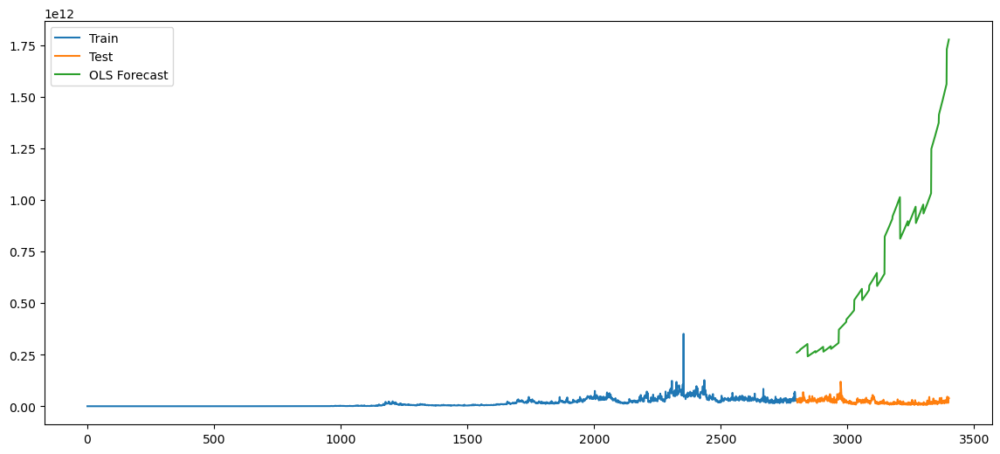

In [134]:
plt.figure(figsize=(14,6))
plt.plot(train_data['Volume'], label='Train')
plt.plot(test_data['Volume'], label='Test')
plt.plot(np.exp(pred_Mult_add_sea), label='OLS Forecast')
plt.legend(loc='best')
plt.show()

In [135]:
#Compare the results 
data = {"Models":pd.Series(["rmse_linear","rmse_Exp","rmse_Quad","rmse_add_sea","rmse_add_sea_quad","rmse_Mult_sea","rmse_Mult_add_sea"]),"RMSE_Values":pd.Series([rmse_linear,rmse_Exp,rmse_Quad,rmse_add_sea,rmse_add_sea_quad,rmse_Mult_sea,rmse_Mult_add_sea])}
table_rmse=pd.DataFrame(data)
table_rmse.sort_values(['RMSE_Values'], inplace=True, ignore_index=True)

In [136]:
e = pd.concat([table_rmse, table_evaluation], ignore_index=True)
# Drop the 'MAPE(%)' column:
e.drop('MAPE(%)', axis=1, inplace=True)
# Sort by 'RMSE_Values':
e.sort_values(['RMSE_Values'], inplace=True, ignore_index=True)

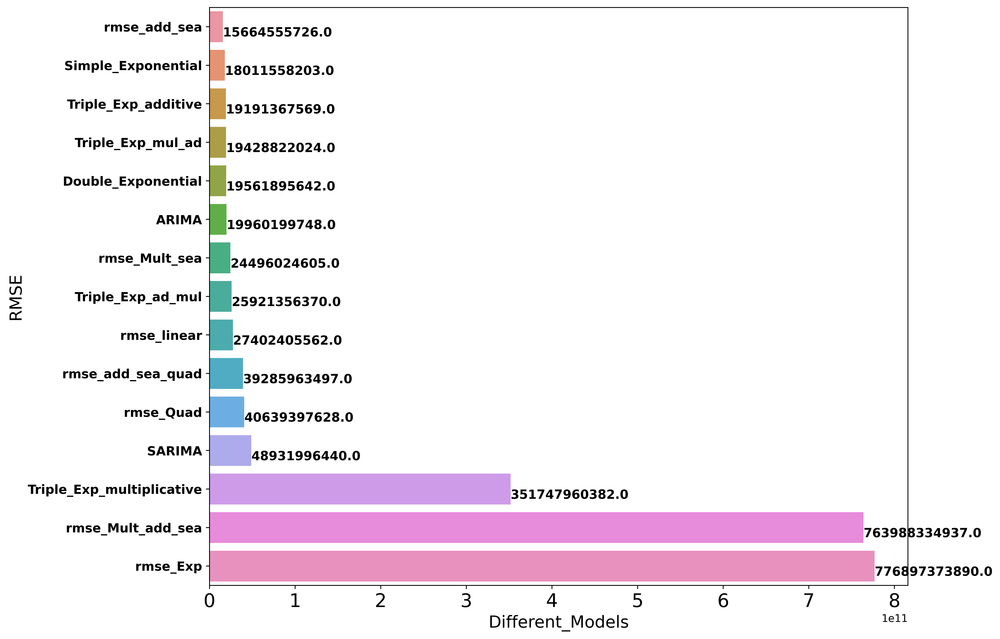

In [137]:
f, axe = plt.subplots(1,1, figsize=(12,10), dpi=500)
sns.barplot(x='RMSE_Values', y='Models', data=e, ax = axe)
axe.set_xlabel('Different_Models', size=16)
axe.set_ylabel('RMSE', size=16)
plt.yticks(fontsize=12,fontweight = 'bold')
plt.xticks(fontsize=18)

for i, v in enumerate(np.round(e.RMSE_Values.values,0)):
    axe.text(v + 3, i + .25, str(v),
            color = 'black', fontweight = 'bold', fontsize= 12)

plt.show()